# EEG Session Quality Control Report
## EFRCourierOpenLoop — BIDS Format

**Purpose:** This notebook implements a standardized, session-level quality control (QC) framework for intracranial EEG (iEEG) studies that combine cognitive task performance with direct brain stimulation. The pipeline is designed to run after each testing session to enable rapid corrective action if any errors are detected.

**Experiment:** *EFRCourierOpenLoop* — a spatial memory task in which patients navigate a virtual town and deliver packages to different stores, while intracranial brain stimulation is delivered at 3 Hz or 8 Hz theta-burst frequencies during encoding and/or retrieval phases.

**Pipeline structure:**

| Section | Manuscript module | What it checks |
|---------|-------------------|----------------|
| 0 | Data Loading | BIDS file paths, channel metadata, and event tables |
| 1 | Module 1: Data Completeness and Protocol Adherence | Event counts, stimulation delivery, and trial structure |
| 2 | Module 2: Behavioral Performance Summary | Navigation time, spatial trajectory, recall accuracy, and intrusions |
| 3 | Module 3: Verification of Stimulation Timing, Spatial Specificity, and Frequency | Stimulation timing, frequency, and spatial artifact distribution |
| 4 | Module 4: Channel Integrity and Artifact Assessment | Line noise, trial-to-trial variability, and temporal variability |
---

> **How to use:** Set `subject`, `session`, and `bids_root` in Section 0, then run all cells top to bottom. Figures are saved as PDFs to `write_fig_path` (default: current directory).


---
## Data Loading

This section establishes the BIDS directory structure and loads three data sources that are used throughout the notebook:

1. **Raw iEEG signal** (`raw`) — loaded via `mne-bids` from the bipolar-referenced EDF file. This provides the continuous voltage time series for all channels.
2. **Channel metadata** (`channel_info`) — a BIDS TSV file containing bipolar pair names (`lead1`, `lead2`), electrode group (shank identity), and anatomical labels for every recorded channel.
3. **Event tables** — merged from two sources:
   - `ieeg/…_events.tsv` — events synchronized to the EEG recording (onset in seconds relative to recording start).
   - `beh/…_events.tsv` — behavioral events logged by the task computer, which may contain richer trial metadata (store names, item identities, stim conditions).

   The two tables are concatenated and sorted by `onset` to produce `df_combined_sorted`, a unified chronological event log used in the downstream QC modules.

**Key BIDS path parameters:**
- `subject` — patient identifier (e.g., `'M1017'`)
- `session` — session number as a zero-padded string (e.g., `'1'`)
- `acquisition` — referencing scheme: `'bipolar'` (default) or `'monopolar'`


In [1]:
import os
import pandas as pd
import mne
import numpy as np
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import sys
import argparse
import glob
import json
from matplotlib.ticker import FuncFormatter
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.colors import ListedColormap
import warnings
import re
from scipy import signal
from scipy.stats import zscore
import mne
from mne_bids import BIDSPath, read_raw_bids
import pandas as pd
from pathlib import Path
from IPython.display import display, Markdown
from datetime import datetime
warnings.filterwarnings("ignore", category=RuntimeWarning)
mne.set_log_level("ERROR")

# Define BIDS path parameters
# OPTION 1: Use absolute path (recommended)
bids_root = '/groups/nxh177-lab-herzlab/processed_data/bids/EfrCourierOpenLoop'
subject = 'M1017'
session = '1'
task = 'EfrCourierOpenLoop'


display(Markdown(f"""
# iEEG Session Quality Control Report

## Subject: `{subject}`  
## Session: `{session}`  
**Experiment:** EFRCourierOpenLoop  
**Generated:** {datetime.now().strftime("%Y-%m-%d")}
"""))

# Verify the path exists

if not Path(bids_root).exists():
    print(f"ERROR: BIDS root does not exist!")
    print(f"Please update bids_root to the correct path")
    import sys
    sys.exit(1)

acquisition = 'bipolar'  # Change to 'monopolar' if needed

# Create BIDSPath with acquisition specified
bids_path = BIDSPath(
subject=subject,
session=session,
task=task,
acquisition=acquisition,  # This is REQUIRED to avoid ambiguity
root=bids_root,
datatype='ieeg',
suffix='ieeg',
extension='.edf'  # Explicitly specify file extension
)




# Read the raw data (this will also load events if they exist)

channels_file_bipolar = Path(bids_root) / f'sub-{subject}' / f'ses-{session}' / 'ieeg' / f'sub-{subject}_ses-{session}_task-{task}_acq-bipolar_channels.tsv'
channel_info = pd.read_csv(channels_file_bipolar, sep='\t')

events_file = Path(bids_root) / f'sub-{subject}' / f'ses-{session}' / 'ieeg' / f'sub-{subject}_ses-{session}_task-{task}_events.tsv'

if events_file.exists():
   eeg_data = pd.read_csv(events_file, sep='\t')
    
beh_path = Path(bids_root) / f'sub-{subject}' / f'ses-{session}' / 'beh'/ f'sub-{subject}_ses-{session}_task-{task}_events.tsv'
if beh_path.exists():
    # Find all behavioral TSV files
    tsv_files = list(beh_path.glob('*.tsv'))
    beh_data = pd.read_csv(beh_path, sep='\t')
    
beh_data['data_from']='behavior'
eeg_data ['data_from']='ieeg'
df_combined = pd.concat([beh_data, eeg_data], ignore_index=True)
df_combined['data_from']
df_combined_sorted = df_combined.sort_values(by="onset", ascending=True)
df_combined_sorted = df_combined_sorted.reset_index(drop=True)
pd.set_option('display.max_rows', None)
raw = read_raw_bids(bids_path=bids_path, verbose="ERROR")




# iEEG Session Quality Control Report

## Subject: `M1017`  
## Session: `1`  
**Experiment:** EFRCourierOpenLoop  
**Generated:** 2026-08-04


In [2]:
display(Markdown("""
## Module 1: Data Completeness and Protocol Adherence

"""))


## Module 1: Data Completeness and Protocol Adherence



---


This module verifies that the behavioral event logs and stimulation records match the expected experimental protocol before downstream analyses are performed.

### 1.1 Event Count Verification

The `EXPECTED_COUNTS` dictionary encodes the *a priori* expected number of each event type for a complete session. The check iterates over all event types and compares observed counts against expected values, printing a color-coded PASS/FAIL table. Expected counts may vary across sessions; experimenters should adjust the expected count accordingly. 

**Event types and their meaning:**

| Event type | Meaning |
|---|---|
| `session_start` | Start of the entire session |
| `trial_start` | Start of a delivery day (encoding list) — 5 trials expected |
| `encoding_word_start` | A store visit where an item was encoded — 56 total |
| `stimming` | A delivered stimulation burst — 84 expected |
| `pointing_start` / `pointing_stop` | Spatial pointing test events — 69 each |
| `fr_start` / `fr_stop` | Free recall period boundaries — 5 each |




In [3]:
# =============================================================================
# CONFIGURATION
# =============================================================================

display(Markdown("""
### 1.1 Event Count Verification
"""))

evs = df_combined_sorted

EXPECTED_COUNTS = {
    'session_start': 1,
    'trial_start': 5,
    'encoding_word_start': 60,
    'stimming': (105),
    'pointing_start': 65,
    'pointing_stop': 65,
    'fr_start': 5,
    'fr_stop': 5,
}

# Verify event counts
RED = '\033[91m'
GREEN = '\033[92m'
RESET = '\033[0m'
BOLD = '\033[1m'
print(f"\nEvent count verification for subject {subject}, session {session}\n")
header = f"{'Event Type':<30} {'Actual':>8} {'Expected':>12} {'Status':>10}"
print(f"\n{BOLD}{header}{RESET}")
print("─" * 64)

event_verification = {}
for event_type, expected in EXPECTED_COUNTS.items():
    actual = (evs['trial_type'] == event_type).sum()

    if isinstance(expected, tuple):
        passed = actual in expected
        expected_str = ' or '.join(str(v) for v in expected)
    else:
        passed = actual == expected
        expected_str = str(expected)

    color = GREEN if passed else RED
    status = 'PASS ✓' if passed else 'FAIL ✗'
    event_verification[event_type] = {
        'actual': actual,
        'expected': expected_str,
        'status': status,
    }
    row = f"{event_type:<30} {actual:>8} {expected_str:>12} {color}{status:>10}{RESET}"
    print(row)

print("─" * 64)
total = len(EXPECTED_COUNTS)
passed_count = sum(1 for v in event_verification.values() if 'PASS' in v['status'])
summary_color = GREEN if passed_count == total else RED

print(f"{summary_color}{BOLD}{passed_count}/{total} checks passed{RESET}\n")


### 1.1 Event Count Verification



Event count verification for subject M1017, session 1


Event Type                       Actual     Expected     Status
────────────────────────────────────────────────────────────────
session_start                         1            1     PASS ✓
trial_start                           5            5     PASS ✓
encoding_word_start                  60           60     PASS ✓
stimming                            105          105     PASS ✓
pointing_start                       65           65     PASS ✓
pointing_stop                        65           65     PASS ✓
fr_start                              5            5     PASS ✓
fr_stop                               5            5     PASS ✓
────────────────────────────────────────────────────────────────
8/8 checks passed



In [4]:
display(Markdown("""
### 1.2 Stimulation Delivery Validation and Trial Phasing
"""))


### 1.2 Stimulation Delivery Validation and Trial Phasing




This step performs three checks:

**Step 1 — Propagate burst frequency to adjacent events.** When a `stimming` event is followed within 3 seconds by another event (e.g., `encoding_word_start`), the `burst_slow_frequency` from the stimulation event is copied forward. This ensures that encoding-word events are assigned the correct stimulation-frequency label for downstream summaries.

**Step 2 — Assign trial numbers.** The raw events table uses `trial_num` inconsistently (NaN outside of trial blocks). This step identifies `trial_start` boundaries, then fills `trial_num` sequentially so that every event row belongs to a uniquely identified delivery day.

**Step 3 — Label task phases.** The `add_phase()` function assigns each event a `phase` label (`'encoding'` or `'retrieval'`) based on its position relative to the `trial_start` → `deliveries_stop` and `fr_start` → `fr_stop` event pairs within each trial. This phase label is essential for distinguishing stimulation effects during memory encoding versus memory retrieval.

**Stimulation summary table (`parameters_df2`):** For each trial, the table shows:
- Burst frequency (3 Hz or 8 Hz)
- Number of stimulation pulses during encoding and retrieval 
- Number of items presented and correctly recalled
- Stimulation channel identity (derived by cross-referencing electrode contacts in `channel_info`)


In [5]:
# Replace the loop that builds parameters_df2

Indexs=evs[evs['trial_type']=='stimming'].index
for Index in Indexs:
    if (evs.iloc[Index + 1]['onset'] - evs.iloc[Index]['onset']) <= 3:
        evs.at[Index + 1, 'burst_slow_frequency'] = evs.iloc[Index]['burst_slow_frequency']
list_evs=evs[evs['trial_type']=='encoding_word_start']
list_evs['burst_slow_frequency'].unique()
evs['trial_num'] = evs['trial_num'].fillna(-999)
trials = evs['trial_num'].unique() 
trials_new = [trial for trial in trials if trial != -999]

# Get indices where trials start (non-practice trials only)
#EVS_START = evs[(evs['trial_type'] == 'trial_start') & (evs['practice'] == 0)].index
EVS_START = evs[(evs['trial_type'] == 'trial_start') ].index
EVS_START = np.array(EVS_START)

# Assign trial numbers to each segment
# First trial_start = Trial 0, then 1, 2, 3, ...
for index_d in range(len(EVS_START)):
    start_idx = EVS_START[index_d]
    
    if index_d == len(EVS_START) - 1:
        end_idx = len(evs) - 1
    else:
        end_idx = EVS_START[index_d + 1] - 1
    
    evs.loc[start_idx:end_idx, 'trial_num'] = index_d
        
def add_phase(evs):
    chunks = []
    for ind, list_evs in evs.groupby('trial_num'):
        list_evs = list_evs.copy()  # avoid SettingWithCopyWarning
        if list_evs['trial_num'].unique()[0] != -999:
            list_evs['phase'] = 'nan'
        if (not list_evs[list_evs['trial_type'] == 'trial_start'].index.empty and
            not list_evs[list_evs['trial_type'] == 'deliveries_stop'].index.empty):

            first_pointing_index = min(list_evs[list_evs['trial_type'] == 'trial_start'].index)
            navigation_end_index = min(list_evs[list_evs['trial_type'] == 'deliveries_stop'].index) - 1
            list_evs.loc[first_pointing_index:navigation_end_index, 'phase'] = 'encoding'

            rec_start_index = list_evs[list_evs['trial_type'] == 'fr_start'].index[0]
            rec_end_index = list_evs[list_evs['trial_type'] == 'fr_stop'].index[0]
            list_evs.loc[rec_start_index:rec_end_index, 'phase'] = 'retrieval'

        chunks.append(list_evs)
    return pd.concat(chunks)

evs_new = add_phase(evs)
parameters_df2=pd.DataFrame()
rows = []
for i, delivery_day_df in evs_new.groupby('trial_num'):
    if len(delivery_day_df['trial_type'].unique()) >= 0:
        encoding_df = delivery_day_df[delivery_day_df['phase'] == 'encoding']
        encoding_stim_num = len(encoding_df[encoding_df['trial_type'] == 'stimming'])

        retrieval_df = delivery_day_df[delivery_day_df['phase'] == 'retrieval']
        retrieval_stim_num = len(retrieval_df[retrieval_df['trial_type'] == 'stimming'])

        stim_df = delivery_day_df[delivery_day_df['trial_type'] == 'stimming']
        burst_freq = stim_df['burst_slow_frequency'].unique()
        retrieval_item_list = set(retrieval_df['item'].dropna().str.lower().unique())
        encode_stim_set = set(encoding_df['item'].dropna().str.lower().unique())
        Number_send = len(encode_stim_set)
        idx_lead1_pos = channel_info[channel_info['lead1'].isin(delivery_day_df['electrode_pos'])].index
        idx_lead1_neg = channel_info[channel_info['lead1'].isin(delivery_day_df['electrode_neg'])].index
        idx_lead2_pos = channel_info[channel_info['lead2'].isin(delivery_day_df['electrode_pos'])].index
        idx_lead2_neg = channel_info[channel_info['lead2'].isin(delivery_day_df['electrode_neg'])].index
        sets = [set(idx_lead1_pos), set(idx_lead1_neg), set(idx_lead2_pos), set(idx_lead2_neg)]
        from collections import Counter

        all_numbers = []
        for s in sets:
            all_numbers.extend(s)

        counts = Counter(all_numbers)
        numbers_twice = [num for num, count in counts.items() if count == 2]
        stim_channel = []
        correct_recall = []
        if len(all_numbers) > 0:
            stim_channel = channel_info['name'].iloc[numbers_twice].values[0]
            correct_recall = len(retrieval_item_list.intersection(encode_stim_set))

        rows.append({
            "Stimulation Frequency (Hz)": burst_freq,
            "Trial": delivery_day_df["trial_num"].unique()[0],
            "Number of Encoding Stim": encoding_stim_num,
            "Number of Retrieval Stim": retrieval_stim_num,
            "Number of Items Sent": Number_send,
            "Recalled Items": correct_recall,
            "Stim Channel": stim_channel,
        })

parameters_df2 = pd.DataFrame(rows)

result_8HZ_encoding= evs_new[(evs_new['phase'] == 'encoding') & (evs_new['burst_slow_frequency'] == 8) & (evs_new['trial_type'] == 'stimming')]
result_3HZ_encoding= evs_new[(evs_new['phase'] == 'encoding') & (evs_new['burst_slow_frequency'] == 3)& (evs_new['trial_type'] == 'stimming')]
result_8HZ_retrieval= evs_new[(evs_new['phase'] == 'retrieval') & (evs_new['burst_slow_frequency'] == 8)& (evs_new['trial_type'] == 'stimming')]
result_3HZ_retrieval= evs_new[(evs_new['phase'] == 'retrieval') & (evs_new['burst_slow_frequency'] == 3)& (evs_new['trial_type'] == 'stimming')]
result_none_encoding = evs[(evs['trial_type'] == 'encoding_word_start') & (evs['stim_condition'] == False)]
print(f"\nStimulation distribution by task phase :")
print(
    f"Encoding: 3 Hz = {len(result_3HZ_encoding)}, "
    f"8 Hz = {len(result_8HZ_encoding)}, "
    f"No stimulation = {len(result_none_encoding)}"
)

print(
    f"Retrieval: 3 Hz = {len(result_3HZ_retrieval)}, "
    f"8 Hz = {len(result_8HZ_retrieval)}"
)


parameters_df2[2:]


Stimulation distribution by task phase :
Encoding: 3 Hz = 18, 8 Hz = 12, No stimulation = 30
Retrieval: 3 Hz = 45, 8 Hz = 30


,Stimulation Frequency (Hz),Trial,Number of Encoding Stim,Number of Retrieval Stim,Number of Items Sent,Recalled Items,Stim Channel
2,[3.0],0.0,6,15,12,1,RB1-RB2
3,[8.0],1.0,6,15,12,3,RB1-RB2
4,[3.0],2.0,6,15,12,1,RB1-RB2
5,[8.0],3.0,6,15,12,1,RB1-RB2
6,[3.0],4.0,6,15,12,3,RB1-RB2


In [6]:
display(Markdown("""
## Module 2: Behavioral Performance Summary
"""))


## Module 2: Behavioral Performance Summary


---

This module summarizes task engagement and behavioral performance using three complementary measures


**Rationale:** In the EFRCourierOpenLoop task, participants navigate a virtual town. The time elapsed between the patient's last pointing response at a store (`pointing_stop`) and the moment they reach that store to deliver an item (`encoding_word_start`) reflects how efficiently they are navigating the virtual environment.

**`load_and_process_bids_events()`:**
1. Extracts all `encoding_word_start` events and assigns each event a stimulation-frequency label (3 Hz, 8 Hz, or −999 = no stim) by finding the nearest `stimming` event.
2. For each encoded word, finds the most recent `pointing_stop` at the same store within the same trial — this is the moment the participant finished pointing to that location.
3. Computes `time = word_onset − pointing_stop_onset` (in seconds) as the navigation duration.

**`plot_navigation_time()`:** Produces a 2-panel figure:
- **Left panel:** Scatter plot of navigation time vs. trial number, color-coded by stimulation frequency, with same-store trajectories connected by gray lines to reveal store-specific learning effects.
- **Right panel:** Histogram with median and mean values overlaid, annotated with skewness and kurtosis statistics.

Prolonged navigation times may indicate fatigue, inability to remember the town layout, or task interruptions, and should be flagged for review.



### 2.1 Navigation Time Analysis


**Note.** Trials start at trial `0`; no practice trial is included in this session.

,Store,Navigation Time (s),Stimulation Frequency,Trial Number,Session,Subject
0,pizzeria,13.837791,3 Hz,0,1,M1017
1,pizzeria,21.381223,8 Hz,1,1,M1017
2,pizzeria,28.509630,3 Hz,2,1,M1017
3,pizzeria,19.418111,8 Hz,3,1,M1017
4,pizzeria,20.234157,3 Hz,4,1,M1017
5,craft shop,17.705013,No Stim,0,1,M1017
6,craft shop,15.087863,No Stim,1,1,M1017
7,craft shop,28.059605,No Stim,2,1,M1017
8,craft shop,29.800704,No Stim,4,1,M1017
9,hardware store,14.617836,No Stim,0,1,M1017



Total rows: 60
Unique stores: 17
Stimulation frequencies: ['3 Hz', '8 Hz', 'No Stim']


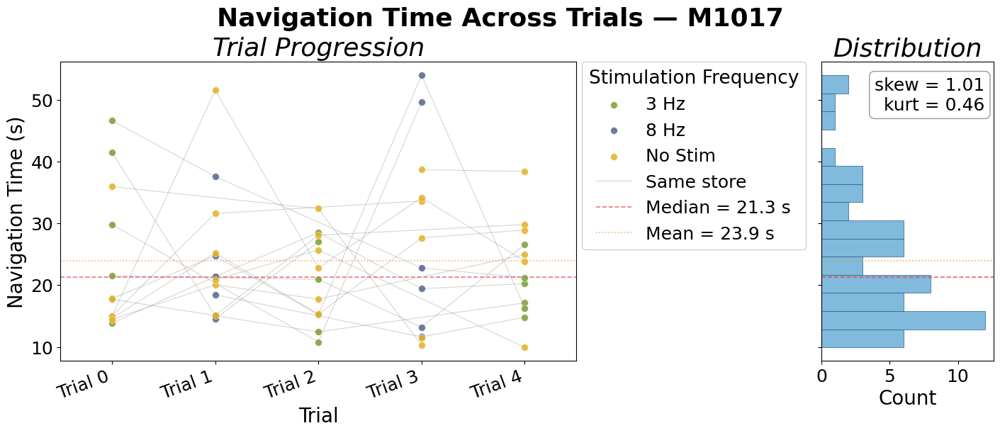

,subject,session,n_trials,n_rows,n_unique_stores
0,M1017,1,5,60,17


In [7]:
"""
EFRCourierOpenLoop Behavioral Processing — BIDS Format
=======================================================

Equivalent to the CML/RAM-format script, adapted for BIDS events.tsv files.

Mapping from original (CML) to BIDS:
  - WORD event          -> encoding_word_start
  - STIM event          -> stimming
  - pointing finished   -> pointing_stop
  - eegoffset (samples) -> onset (seconds)
  - stim_params['burst_freq'] -> burst_slow_frequency from nearest stimming event
  - evs['trial']        -> trial_num
  - evs['store']        -> store
  - evs['mstime']       -> onset, already in seconds
  - inside_stimuli      -> stimulation_frequency
                           -999 = No Stim, 3.0 = 3 Hz, 8.0 = 8 Hz

Output:
  result_list DataFrame with columns:
  store, time, stimulation_frequency, visit_time, trial, trial_label, session, subject
"""

import pandas as pd
import numpy as np
from IPython.display import display, Markdown

display(Markdown("""
### 2.1 Navigation Time Analysis
"""))


def load_and_process_bids_events(evs, subject, session):
    """
    Process BIDS-format events to produce the navigation-time table.

    Parameters
    ----------
    evs : pd.DataFrame
        BIDS-format events table.
    subject : str
        Subject identifier.
    session : str or int
        Session identifier.

    Returns
    -------
    result_list : pd.DataFrame
        Columns:
        store, time, stimulation_frequency, visit_time,
        trial, trial_label, session, subject
    """

    # ---- Step 1: Extract encoding words and assign stimulation frequency ----
    words = evs[evs["trial_type"] == "encoding_word_start"].copy()
    stims = evs[evs["trial_type"] == "stimming"].copy()

    conditions = []

    for _, w in words.iterrows():
        if w["stim_condition"] == True:
            # Find nearest stimming event by onset
            diffs = (stims["onset"] - w["onset"]).abs()
            nearest_idx = diffs.idxmin()
            freq = stims.loc[nearest_idx, "burst_slow_frequency"]
            conditions.append(freq)
        else:
            conditions.append(-999.0)

    words["stimulation_frequency"] = conditions

    # ---- Step 2: Extract pointing_stop events ----
    pointing_stops = evs[evs["trial_type"] == "pointing_stop"].copy()

    # ---- Step 3: Pair pointing_stop with encoding_word_start per trial ----
    # Trials start from 0.
    valid_report_trials = [0, 1, 2, 3, 4]

    trials = words["trial_num"].unique()
    trials = sorted([t for t in trials if t in valid_report_trials])

    Words_all = []

    for trial in trials:
        trial_words = words[words["trial_num"] == trial].reset_index(drop=True)
        trial_ps = pointing_stops[pointing_stops["trial_num"] == trial].reset_index(drop=True)

        for _, word in trial_words.iterrows():
            # Find pointing_stop at the same store, preceding this word
            matching = trial_ps[
                (trial_ps["store"] == word["store"]) &
                (trial_ps["onset"] < word["onset"])
            ]

            if len(matching) == 0:
                continue

            # Take the most recent matching pointing_stop
            nearest_ps = matching.iloc[-1]

            Words_all.append({
                "store": word["store"],
                "ps_onset": nearest_ps["onset"],
                "word_onset": word["onset"],
                "stimulation_frequency": word["stimulation_frequency"],
                "trial": trial,
            })

    Words_all = pd.DataFrame(Words_all)

    if Words_all.empty:
        raise ValueError(
            "No matched pointing_stop and encoding_word_start events were found "
            "for the selected report trials."
        )

    # ---- Step 4: Compute per-store visit time and result_list ----
    # visit_time = repeated-visit order within each store.
    # This variable is used internally to connect repeated visits to the same store
    # in the navigation-time plot, but it is omitted from the reader-facing table.

    result_rows = []

    for store in Words_all["store"].unique():
        store_data = Words_all[Words_all["store"] == store].reset_index(drop=True)

        for i in range(len(store_data)):
            row = store_data.iloc[i]

            trial = int(row["trial"])
            trial_label = f"Trial {trial}"

            result_rows.append({
                "store": row["store"],
                "time": row["word_onset"] - row["ps_onset"],
                "stimulation_frequency": row["stimulation_frequency"],
                "visit_time": i,
                "trial": trial,
                "trial_label": trial_label,
                "session": session,
                "subject": subject,
            })

    result_list = pd.DataFrame(result_rows)

    return result_list


def plot_navigation_time(df, write_fig_path=None):
    """
    Plot navigation time across trials.

    Parameters
    ----------
    df : pd.DataFrame
        Output from load_and_process_bids_events().
        Must have columns:
        store, time, stimulation_frequency, visit_time, trial, subject.

        Note:
        'time' is already in seconds for BIDS data.

    write_fig_path : str or None
        If provided, save figure to this path before plt.show().
    """

    import matplotlib.pyplot as plt
    from matplotlib.lines import Line2D
    from scipy.stats import skew, kurtosis

    # ---- Shared style constants ----
    FONTSIZE_SUPTITLE = 26
    FONTSIZE_TITLE = 26
    FONTSIZE_LABEL = 20
    FONTSIZE_TICK = 18
    FONTSIZE_ANNOTATION = 18
    FONTSIZE_LEGEND = 18

    COLOR_HIST = "#6BAED6"
    COLOR_HIST_EDGE = "#2C5F8A"
    COLOR_MEDIAN = "#D64545"
    COLOR_MEAN = "#E8963E"

    COND_COLORS = {
        3.0: "#7EA03C",
        8.0: "#576B8E",
        -999.0: "#E5B327",
    }

    COND_LABELS = {
        3.0: "3 Hz",
        8.0: "8 Hz",
        -999.0: "No Stim",
    }

    # ---- Prepare data ----
    df = df.copy()
    df["time_s"] = df["time"]

    subject = df["subject"].iloc[0]

    # Make sure stimulation frequencies are numeric floats
    df["stimulation_frequency"] = df["stimulation_frequency"].astype(float)

    # Reader-facing x-axis labels
    # Trials start from 0, with no practice trial.
    trial_order = [0, 1, 2, 3, 4]
    trial_label_map = {
        0: "Trial 0",
        1: "Trial 1",
        2: "Trial 2",
        3: "Trial 3",
        4: "Trial 4"
    }

    # ---- Stats ----
    med_time = df["time_s"].median()
    mean_time = df["time_s"].mean()
    sk = skew(df["time_s"])
    kurt = kurtosis(df["time_s"])

    # ---- Figure ----
    fig, (ax_main, ax_hist) = plt.subplots(
        1,
        2,
        figsize=(14, 6),
        gridspec_kw={"width_ratios": [3, 1]},
        constrained_layout=True,
    )

    fig.suptitle(
        f"Navigation Time Across Trials — {subject}",
        fontsize=FONTSIZE_SUPTITLE,
        fontweight="bold",
    )

    # ---- Left panel: scatter + same-store lines ----
    for store, grp in df.groupby("store"):
        grp_sorted = grp.sort_values("visit_time")
        ax_main.plot(
            grp_sorted["trial"],
            grp_sorted["time_s"],
            color="#AAAAAA",
            linewidth=0.8,
            alpha=0.5,
            zorder=1,
        )

    for cond in [3.0, 8.0, -999.0]:
        mask = df["stimulation_frequency"] == cond

        if mask.sum() == 0:
            continue

        ax_main.scatter(
            df.loc[mask, "trial"],
            df.loc[mask, "time_s"],
            s=50,
            color=COND_COLORS[cond],
            edgecolors="white",
            linewidths=0.4,
            alpha=0.88,
            zorder=3,
            label=COND_LABELS[cond],
        )

    ax_main.axhline(
        med_time,
        color=COLOR_MEDIAN,
        linestyle="--",
        linewidth=1.2,
        alpha=0.7,
    )

    ax_main.axhline(
        mean_time,
        color=COLOR_MEAN,
        linestyle=":",
        linewidth=1.2,
        alpha=0.7,
    )

    # ---- Legend ----
    handles, labels = ax_main.get_legend_handles_labels()

    handles.append(Line2D([0], [0], color="#AAAAAA", linewidth=0.8, alpha=0.5))
    labels.append("Same store")

    handles.append(Line2D([0], [0], color=COLOR_MEDIAN, linestyle="--", linewidth=1.2, alpha=0.7))
    labels.append(f"Median = {med_time:.1f} s")

    handles.append(Line2D([0], [0], color=COLOR_MEAN, linestyle=":", linewidth=1.2, alpha=0.7))
    labels.append(f"Mean = {mean_time:.1f} s")

    ax_main.legend(
        handles,
        labels,
        fontsize=FONTSIZE_LEGEND,
        loc="upper left",
        bbox_to_anchor=(1.01, 1.0),
        framealpha=0.9,
        borderaxespad=0,
        title="Stimulation Frequency",
        title_fontsize=FONTSIZE_LEGEND + 1,
    )

    ax_main.set_xlabel("Trial", fontsize=FONTSIZE_LABEL)
    ax_main.set_ylabel("Navigation Time (s)", fontsize=FONTSIZE_LABEL)
    ax_main.set_title("Trial Progression", fontsize=FONTSIZE_TITLE, fontstyle="italic")

    ax_main.set_xticks(trial_order)
    ax_main.set_xticklabels(
        [trial_label_map[t] for t in trial_order],
        rotation=20,
        ha="right"
    )

    ax_main.set_xlim(-0.5, 4.5)
    ax_main.tick_params(labelsize=FONTSIZE_TICK)

    # ---- Right panel: distribution histogram ----
    n_bins = 15

    ax_hist.hist(
        df["time_s"],
        bins=n_bins,
        orientation="horizontal",
        color=COLOR_HIST,
        edgecolor=COLOR_HIST_EDGE,
        linewidth=0.6,
        alpha=0.85,
    )

    ax_hist.axhline(
        med_time,
        color=COLOR_MEDIAN,
        linestyle="--",
        linewidth=1.2,
        alpha=0.8,
    )

    ax_hist.axhline(
        mean_time,
        color=COLOR_MEAN,
        linestyle=":",
        linewidth=1.2,
        alpha=0.8,
    )

    ax_hist.set_xlabel("Count", fontsize=FONTSIZE_LABEL)
    ax_hist.set_title("Distribution", fontsize=FONTSIZE_TITLE, fontstyle="italic")
    ax_hist.tick_params(labelsize=FONTSIZE_TICK)
    ax_hist.set_yticklabels([])

    # Align y-axes
    ax_hist.set_ylim(ax_main.get_ylim())

    ax_hist.text(
        0.95,
        0.95,
        f"skew = {sk:.2f}\nkurt = {kurt:.2f}",
        transform=ax_hist.transAxes,
        fontsize=FONTSIZE_ANNOTATION,
        va="top",
        ha="right",
        bbox=dict(
            boxstyle="round,pad=0.3",
            facecolor="white",
            edgecolor="gray",
            alpha=0.8,
        ),
    )

    # ---- Save and show ----
    if write_fig_path:
        fig.savefig(write_fig_path, dpi=300, bbox_inches="tight")

    plt.show()

    # Summary table
    deliv_table = df.groupby(["subject", "session"]).agg(
        n_trials=("trial", "nunique"),
        n_rows=("store", "count"),
        n_unique_stores=("store", "nunique"),
    ).reset_index()

    return fig, deliv_table


def display_navigation_table(result_list):
    """
    Display a reader-facing navigation table for the report.

    This table removes the internal visit_time variable and uses
    Stimulation Frequency instead of condition.
    """

    result_list = result_list.copy()

    freq_map = {
        -999: "No Stim",
        -999.0: "No Stim",
        3: "3 Hz",
        3.0: "3 Hz",
        8: "8 Hz",
        8.0: "8 Hz",
    }

    result_list["Stimulation Frequency"] = result_list["stimulation_frequency"].map(freq_map)

    result_list["Stimulation Frequency"] = result_list["Stimulation Frequency"].fillna(
        result_list["stimulation_frequency"].astype(str)
    )

    result_list["Trial Label"] = result_list["trial"].map(
        lambda x: f"Trial {int(x)}"
    )

    display(Markdown(
        "**Note.** Trials start at trial `0`; no practice trial is included in this session."
    ))

    display_cols = {
        "store": "Store",
        "time": "Navigation Time (s)",
        "Stimulation Frequency": "Stimulation Frequency",
        "trial": "Trial Number",
        "session": "Session",
        "subject": "Subject",
    }

    display_table = result_list[list(display_cols.keys())].rename(columns=display_cols)

    display(display_table)

    print(f"\nTotal rows: {len(result_list)}")
    print(f"Unique stores: {result_list['store'].nunique()}")
    print(
        "Stimulation frequencies:",
        sorted(result_list["Stimulation Frequency"].dropna().unique())
    )

    return display_table


# ---------------------------------------------------------------------
# Example usage
# ---------------------------------------------------------------------

result_list = load_and_process_bids_events(
    evs,
    subject=subject,
    session=session
)

display_table = display_navigation_table(result_list)

fig, deliv_table = plot_navigation_time(
    result_list,
    write_fig_path="Navigation_time.png"
)

display(deliv_table)

In [8]:
display(Markdown("""
### 2.2 Spatial Trajectory Visualization
"""))


### 2.2 Spatial Trajectory Visualization




**Rationale:** Player locations in the virtual environment are recorded as continuous `player_position` events (y, z coordinates in the game world). Visualizing the navigation path for each trial provides a sanity check that:
- The patient is actively navigating (not sitting still)
- Store locations are correctly labeled
- The trajectory follows a plausible task structure (e.g., all stores are visited in the correct order)

**Implementation details:**
- `extract_player_positions()` parses the comma-separated position string into numeric (y, z) columns.
- `positions_to_segments()` converts the position array into a LineCollection segment array, enabling color-mapped time-ordered rendering via `matplotlib.collections.LineCollection`. The color gradient (copper_r colormap, dark → light) reflects temporal progression from trial start to end.
- `remove_stationary_segments()` filters out zero-movement frames to reduce visual clutter from pause events.
- `draw_store_markers()` overlays store locations with delivery-order annotations, using staggered offsets to avoid label overlap.

Each subplot corresponds to one delivery day, or trial. An absent or stationary trajectory signals a data capture failure.


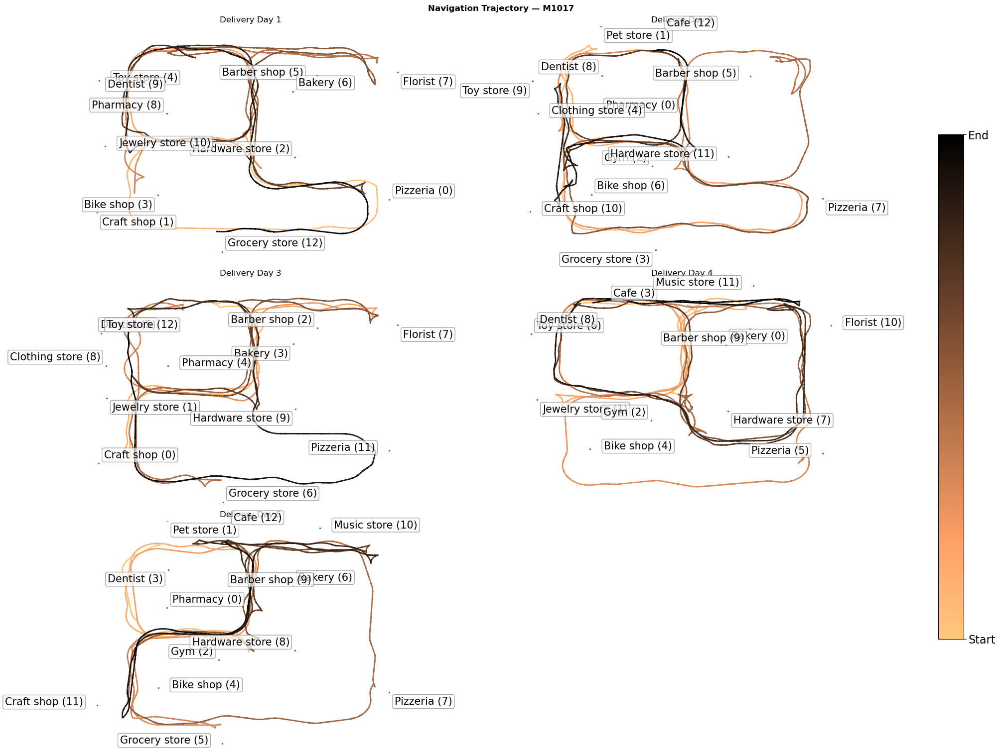

In [9]:


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection

# ── Layout & style ──────────────────────────────────────────────────────────
GRID_COLS              = 2
FIG_WIDTH              = 20
FIG_HEIGHT_PER_ROW     = 5
LINE_WIDTH             = 2
LINE_ALPHA             =1
STORE_MARKER_SIZE      = 12

FONTSIZE_SUPTITLE = 12
FONTSIZE_TITLE    = 12
FONTSIZE_STORE    = 15

STORE_EVENT_TYPES = ['encoding_word_start', 'pointing_start', 'delivery_start']
TRAJECTORY_CMAP   = 'copper_r'

# Staggered annotation offsets to avoid label overlap
LABEL_OFFSETS = [(8, 8), (8, -18), (-8, 8), (-8, -18), (20, 0), (-20, 0)]


# ── Data extraction helpers ─────────────────────────────────────────────────

def extract_player_positions(evs: pd.DataFrame) -> pd.DataFrame:
    """Return player_position rows with numeric pos_y and pos_z columns."""
    pp = evs[evs['trial_type'] == 'player_position'].copy()
    coords = pp['player_position'].str.split(',', expand=True).astype(float)
    pp['pos_y'] = coords[0]
    pp['pos_z'] = coords[1]
    return pp


def extract_store_locations(evs: pd.DataFrame) -> pd.DataFrame:
    """Return store events that carry a valid store name and position."""
    store_evs = evs[evs['trial_type'].isin(STORE_EVENT_TYPES)].copy()
    return store_evs.dropna(subset=['store_position', 'store'])


def get_trial_list(player_positions: pd.DataFrame) -> list[int]:
    """Return sorted trial numbers, excluding the practice trial (-1)."""
    return sorted(t for t in player_positions['trial_num'].unique() if t >= 0)


# ── Trajectory geometry helpers ─────────────────────────────────────────────

def positions_to_segments(y: np.ndarray, z: np.ndarray) -> np.ndarray:
    """
    Convert (y, z) position arrays into an (N-1, 2, 2) segment array
    for use with LineCollection.
    """
    pos    = np.column_stack([y, z])
    points = pos.reshape(-1, 1, 2)
    return np.concatenate([points[:-1], points[1:]], axis=1)


def remove_stationary_segments(segments: np.ndarray) -> np.ndarray:
    """Drop consecutive segments where the player did not move."""
    if len(segments) <= 1:
        return segments
    moved = np.any(np.diff(segments, axis=0) != 0, axis=(1, 2))
    return segments[1:][moved]


def make_trajectory_collection(segments: np.ndarray) -> LineCollection:
    """Build a color-mapped LineCollection from a segment array."""
    lc = LineCollection(segments, cmap=TRAJECTORY_CMAP)
    lc.set_array(np.linspace(0, 1, len(segments)))
    lc.set_linewidth(LINE_WIDTH)
    lc.set_alpha(LINE_ALPHA)
    return lc


# ── Per-axis drawing ─────────────────────────────────────────────────────────

def draw_trial_trajectory(ax, trial_pp: pd.DataFrame) -> LineCollection | None:
    """
    Draw the player path for one trial. Returns the LineCollection
    (needed later for the colorbar), or None if there are no segments.
    """
    segments = positions_to_segments(trial_pp['pos_y'].values,
                                     trial_pp['pos_z'].values)
    segments = remove_stationary_segments(segments)

    if len(segments) == 0:
        return None

    lc = make_trajectory_collection(segments)
    ax.add_collection(lc)

    # LineCollection does not update axis limits automatically —
    # set them explicitly from the raw position data.
    all_y  = trial_pp['pos_y'].values
    all_z  = trial_pp['pos_z'].values
    margin = (all_y.max() - all_y.min() + all_z.max() - all_z.min()) * 0.05
    ax.set_xlim(all_y.min() - margin, all_y.max() + margin)
    ax.set_ylim(all_z.min() - margin, all_z.max() + margin)

    return lc


def draw_store_markers(ax, trial_stores: pd.DataFrame) -> None:
    """Scatter-plot store locations and annotate each with its name."""
    if trial_stores.empty:
        return

    coords      = trial_stores['store_position'].str.split(',', expand=True).astype(float)
    store_y     = coords[0].values
    store_z     = coords[1].values
    store_names = trial_stores['store'].values

    ax.scatter(store_y, store_z,
               s=STORE_MARKER_SIZE, c='#1f77b4',
               edgecolors='white', linewidths=1.0, zorder=5)

    for delivery_order, (sy, sz, name) in enumerate(zip(store_y, store_z, store_names)):
        dx, dy = LABEL_OFFSETS[delivery_order % len(LABEL_OFFSETS)]
        ax.annotate(
            f'{name.capitalize()} ({delivery_order})',
            xy=(sy, sz),
            xytext=(dx, dy),
            textcoords='offset points',
            fontsize=FONTSIZE_STORE,
            ha='left' if dx >= 0 else 'right',
            bbox=dict(boxstyle='round,pad=0.2',
                      facecolor='white', edgecolor='gray', alpha=0.7),
            zorder=6,
        )


# ── Figure assembly ──────────────────────────────────────────────────────────

def add_colorbar(fig, mappable, axes_used) -> None:
    """Add a Start→End colorbar anchored to the used axes."""
    cbar = fig.colorbar(mappable, ax=axes_used,
                        location='right', shrink=0.7)
    cbar.ax.tick_params(labelsize=16)
    cbar.ax.set_yticks([0, 1])
    cbar.ax.set_yticklabels(['Start', 'End'])


def plot_trajectory(evs: pd.DataFrame,
                    subject: str = 'unknown',
                    write_fig_path: str | None = None):
    """
    Plot per-trial navigation trajectories for one subject/session.

    Parameters
    ----------
    evs : pd.DataFrame
        BIDS events table (all trial_type rows).
    subject : str
        Label shown in the figure title.
    write_fig_path : str or None
        If given, save the figure to this path before displaying.

    Returns
    -------
    fig : matplotlib.figure.Figure
    """
    player_positions = extract_player_positions(evs)
    store_locations  = extract_store_locations(evs)
    trials           = get_trial_list(player_positions)

    n_rows = len(trials) // GRID_COLS + len(trials) % GRID_COLS
    fig, axes = plt.subplots(
        n_rows, GRID_COLS,
        figsize=(FIG_WIDTH, FIG_HEIGHT_PER_ROW * n_rows),
        constrained_layout=True,
    )
    axes = axes.ravel()
    fig.suptitle(f'Navigation Trajectory — {subject}',
                 fontsize=FONTSIZE_SUPTITLE, fontweight='bold')
    fig.set_facecolor('white')

    last_lc = None

    for idx, trial in enumerate(trials):
        ax = axes[idx]

        trial_positions = player_positions[player_positions['trial_num'] == trial]
        trial_stores    = (store_locations[store_locations['trial_num'] == trial]
                           .drop_duplicates('store'))

        lc = draw_trial_trajectory(ax, trial_positions)
        if lc is not None:
            last_lc = lc

        draw_store_markers(ax, trial_stores)

        ax.set_title(f'Delivery Day {int(trial) + 1}', fontsize=FONTSIZE_TITLE)
        ax.axis('off')

    for idx in range(len(trials), len(axes)):
        axes[idx].set_visible(False)

    if last_lc is not None:
        add_colorbar(fig, last_lc, axes[:len(trials)])

    if write_fig_path:
        fig.savefig(write_fig_path, dpi=150, bbox_inches='tight')
        

    plt.show()
    
    return fig


# ── Entry point ──────────────────────────────────────────────────────────────

fig = plot_trajectory(evs, subject=subject,  write_fig_path='trajectory.png')

In [10]:
display(Markdown("""
### 2.3 Recall Performance Summary
"""))


### 2.3 Recall Performance Summary




**Rationale:** Free recall accuracy and intrusion rates are the primary behavioral outcomes of the EFRCourierOpenLoop experiment. This analysis summarizes recall performance and intrusion rates by stimulation condition to verify task engagement and identify unusual behavioral patterns within the session.

**`compute_recall_stats()`** returns five objects:
- `trial_stats` — per-trial summary (list length, correct recalls, intrusions, accuracy)
- `cond_stats` — per-word table with encoding condition and whether the word was recalled
- `intrusion_df` — each intrusion event labeled with its **retrieval-time** stimulation condition (PLI and ELI are pooled, as the QC report does not distinguish intrusion type)
- `ret_cond_counts` — session-level count of recall responses
- `trial_ret_cond_counts` — per-trial version of the above, used to determine whether a condition was active in a given trial (for the 0/0 placeholder logic)

**Retrieval condition assignment** (`get_retrieval_condition()`): Each recall vocalization (`fr_rec_word`) is matched to the nearest `stimming` event within a ±3000 ms window (the stimulation duration). If no stimulation event falls within that window, the recall is labeled as occurring outside stimulation (No Stimulation).

**4-panel figure:**
- **Panel A:** Correct recalls per trial, broken down by stimulation condition during encoding (3 bars/trial). The right y-axis shows overall accuracy (%), reflected by the overlaid line.
- **Panel B:** Aggregate recall accuracy across all trials, split by overall/stimulation/no-stimulation.
- **Panel C:** Intrusion count per trial, split by retrieval stimulation condition.
- **Panel D:** Total intrusion count aggregated across trials.


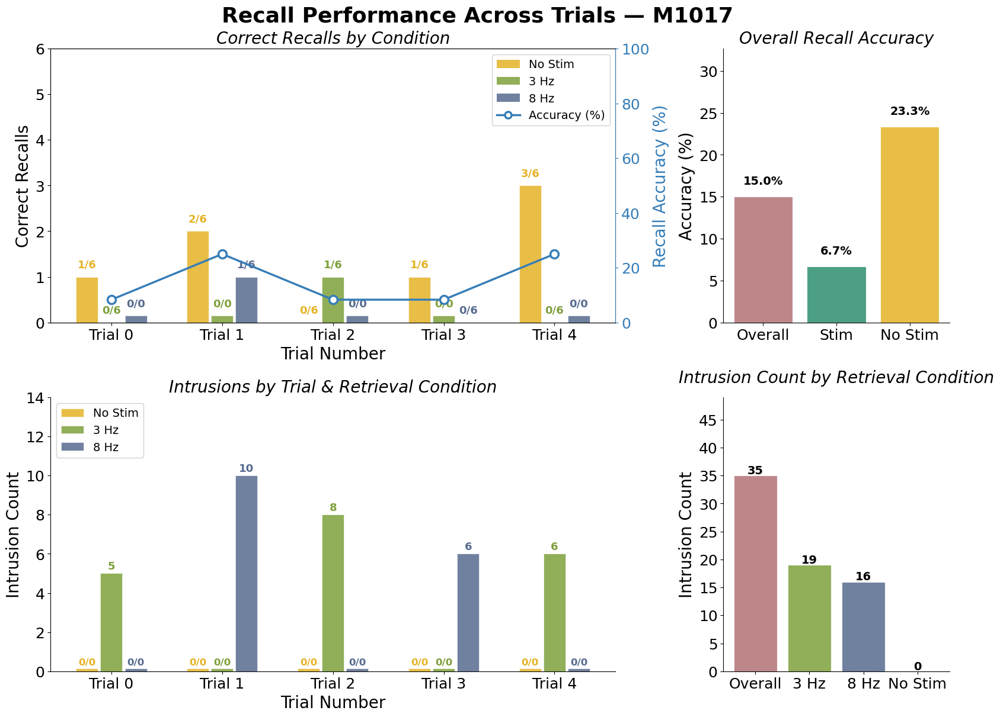

 trial  list_len  correct  intrusions  accuracy  stim_correct  stim_total  nostim_correct  nostim_total
     0        12        1           5  0.083333             0           6               1             6
     1        12        3          10  0.250000             1           6               2             6
     2        12        1           8  0.083333             1           6               0             6
     3        12        1           6  0.083333             0           6               1             6
     4        12        3           6  0.250000             0           6               3             6


In [11]:
"""
EFRCourierOpenLoop Recall Performance Plot — BIDS Format
=========================================================
Recall performance as a function of trial number.

Panel A (top-left):     Correct recalls per trial by condition + accuracy line.
                        Always 3 bars per trial; 0/0 placeholder if condition absent.
Panel B (top-right):    Overall recall accuracy by condition (unchanged).
Panel C (bottom-left):  Intrusions per trial by RETRIEVAL-time condition (PLI+ELI combined).
Panel D (bottom-right): Total intrusion count by retrieval-time condition (same format as B).
"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
import time

# ── Shared style constants ──
FONTSIZE_SUPTITLE   = 26
FONTSIZE_TITLE      = 20
FONTSIZE_LABEL      = 20
FONTSIZE_TICK       = 18
FONTSIZE_ANNOTATION = 14
FONTSIZE_LEGEND     = 14

PLACEHOLDER_HEIGHT = 0.15

COND_COLORS = {
    3.0:    '#7EA03C',
    8.0:    '#576B8E',
    -999.0: '#E5B327',
}
COND_LABELS = {
    3.0:    '3 Hz',
    8.0:    '8 Hz',
    -999.0: 'No Stim',
}

COLOR_ACC_LINE = '#377EB8'




def get_retrieval_condition(onset, stims):
    """
    Return the stim condition active at retrieval time for a given recall onset.
    Uses a 2000 ms window; returns -999.0 if no stim is within that window.
    """
    if stims is None or len(stims) == 0:
        return -999.0
    diffs = (stims['onset'] - onset).abs()
    idx   = diffs.idxmin()
    if diffs[idx] <= 3000:
        return stims.loc[idx, 'burst_slow_frequency']
    return -999.0


def compute_recall_stats(evs):
    """
    Compute per-trial recall statistics from BIDS events DataFrame.

    Returns
    -------
    trial_stats           : pd.DataFrame  per-trial correct/intrusion counts
    cond_stats            : pd.DataFrame  per-encoding-word recall with encoding condition
    intrusion_df          : pd.DataFrame  per-intrusion with RETRIEVAL-time condition
                                          (PLI and ELI combined, no type distinction)
    ret_cond_counts       : dict          total recall events per retrieval condition (global)
    trial_ret_cond_counts : dict          {trial -> {cond -> count}} for per-trial denominators
    """
    enc   = evs[evs['trial_type'] == 'encoding_word_start'].copy()
    rec   = evs[(evs['trial_type'] == 'fr_rec_word') & (evs['practice'] == False)].copy()
    stims = evs[evs['trial_type'] == 'stimming'].copy()

    all_enc_items = set(enc['item'].str.upper())
    trials = sorted([t for t in enc['trial_num'].unique() if t >= 0])

    # Build item -> encoding condition lookup (Panel A only)
    item_cond_lookup = {}
    for _, row in enc.iterrows():
        item_upper = row['item'].upper()
        if row['stim_condition'] == True and len(stims) > 0:
            diffs = (stims['onset'] - row['onset']).abs()
            freq  = stims.loc[diffs.idxmin(), 'burst_slow_frequency']
        else:
            freq = -999.0
        if item_upper not in item_cond_lookup:
            item_cond_lookup[item_upper] = []
        item_cond_lookup[item_upper].append({'trial': row['trial_num'], 'condition': freq})

    trial_stats           = []
    cond_stats            = []
    intrusion_records     = []
    ret_cond_counts       = {3.0: 0, 8.0: 0, -999.0: 0}
    trial_ret_cond_counts = {}

    for t in trials:
        trial_enc = enc[enc['trial_num'] == t]
        trial_rec = rec[rec['trial_num'] == t]

        enc_items = list(trial_enc['item'].str.upper())
        enc_set   = set(enc_items)

        seen       = set()
        correct    = 0
        intrusions = 0

        trial_ret_cond_counts[t] = {3.0: 0, 8.0: 0, -999.0: 0}

        for _, rec_row in trial_rec.iterrows():
            r = rec_row['item'].upper()
            if r == '<>':
                continue

            ret_cond = get_retrieval_condition(rec_row['onset'], stims)
            ret_cond_counts[ret_cond]          = ret_cond_counts.get(ret_cond, 0) + 1
            trial_ret_cond_counts[t][ret_cond] = trial_ret_cond_counts[t].get(ret_cond, 0) + 1

            if r in enc_set:
                if r not in seen:
                    correct += 1
                    seen.add(r)
            else:
                # Both PLI and ELI treated as intrusion
                intrusions += 1
                intrusion_records.append({
                    'trial':         int(t),
                    'item':          r,
                    'ret_condition': ret_cond,
                })

        list_len = len(enc_items)
        accuracy = correct / list_len if list_len > 0 else 0

        stim_enc       = trial_enc[trial_enc['stim_condition'] == True]['item'].str.upper().tolist()
        nostim_enc     = trial_enc[trial_enc['stim_condition'] == False]['item'].str.upper().tolist()
        stim_correct   = len([i for i in stim_enc   if i in seen])
        nostim_correct = len([i for i in nostim_enc if i in seen])

        trial_stats.append({
            'trial':          int(t),
            'list_len':       list_len,
            'correct':        correct,
            'intrusions':     intrusions,
            'accuracy':       accuracy,
            'stim_correct':   stim_correct,   'stim_total':   len(stim_enc),
            'nostim_correct': nostim_correct, 'nostim_total': len(nostim_enc),
        })

        recalled_set = seen
        for _, row in trial_enc.iterrows():
            item_upper = row['item'].upper()
            if row['stim_condition'] == True and len(stims) > 0:
                diffs = (stims['onset'] - row['onset']).abs()
                freq  = stims.loc[diffs.idxmin(), 'burst_slow_frequency']
            else:
                freq = -999.0
            cond_stats.append({
                'trial':    int(t),
                'item':     item_upper,
                'store':    row['store'],
                'condition': freq,
                'recalled': item_upper in recalled_set,
            })

    return (
        pd.DataFrame(trial_stats),
        pd.DataFrame(cond_stats),
        pd.DataFrame(intrusion_records) if intrusion_records else pd.DataFrame(
            columns=['trial', 'item', 'ret_condition']),
        ret_cond_counts,
        trial_ret_cond_counts,
    )


def plot_recall_performance(evs, subject, write_fig_path=None):
    """
    Plot recall performance across trials (2x2 layout).
    """
    (trial_stats, cond_stats, intrusion_df,
     ret_cond_counts, trial_ret_cond_counts) = compute_recall_stats(evs)

    trials    = trial_stats['trial'].values
    x         = np.arange(len(trials))
    bar_width = 0.22

    fig = plt.figure(figsize=(16, 12), constrained_layout=True)
    gs  = fig.add_gridspec(2, 2, width_ratios=[2.5, 1])

    ax_correct   = fig.add_subplot(gs[0, 0])
    ax_overall   = fig.add_subplot(gs[0, 1])
    ax_intrusion = fig.add_subplot(gs[1, 0])
    ax_intr_ovr  = fig.add_subplot(gs[1, 1])

    fig.suptitle(f'Recall Performance Across Trials — {subject}',
                 fontsize=FONTSIZE_SUPTITLE, fontweight='bold')

    # ════════════════════════════════════════════
    # Panel A: Correct recalls by encoding condition
    # Always 3 bars per trial; tiny placeholder + 0/0 if condition absent
    # ════════════════════════════════════════════
    offsets = {-999.0: -bar_width, 3.0: 0, 8.0: bar_width}

    for cond, offset in offsets.items():
        cond_correct = []
        cond_total   = []
        for t in trials:
            t_cond = cond_stats[(cond_stats['trial'] == t) &
                                (cond_stats['condition'] == cond)]
            cond_correct.append(int(t_cond['recalled'].sum()))
            cond_total.append(len(t_cond))

        bar_vals = [c if tot > 0 else PLACEHOLDER_HEIGHT
                    for c, tot in zip(cond_correct, cond_total)]

        ax_correct.bar(x + offset, bar_vals, bar_width * 0.9,
                       color=COND_COLORS[cond], edgecolor='white',
                       linewidth=0.5, alpha=0.85, zorder=3)

        for xi, c, tot, bv in zip(x + offset, cond_correct, cond_total, bar_vals):
            label_text = f'{c}/{tot}' if tot > 0 else '0/0'
            ax_correct.text(xi, bv + 0.15, label_text,
                            ha='center', va='bottom',
                            fontsize=FONTSIZE_ANNOTATION - 1,
                            fontweight='bold', color=COND_COLORS[cond])

    ax_acc = ax_correct.twinx()
    acc_vals = np.where(
        trial_stats['list_len'].values > 0,
        trial_stats['correct'].values / trial_stats['list_len'].values * 100,
        np.nan
    )
    ax_acc.plot(x, acc_vals, 'o-', color=COLOR_ACC_LINE, linewidth=2.5,
                markersize=10, markerfacecolor='white', markeredgewidth=2.5, zorder=5)
    ax_acc.set_ylabel('Recall Accuracy (%)', fontsize=FONTSIZE_LABEL, color=COLOR_ACC_LINE)
    ax_acc.tick_params(axis='y', labelsize=FONTSIZE_TICK, colors=COLOR_ACC_LINE)
    ax_acc.set_ylim(0, 100)
    ax_correct.set_ylim(0, 6)
    ax_acc.spines['right'].set_color(COLOR_ACC_LINE)

    ax_correct.set_xlabel('Trial Number', fontsize=FONTSIZE_LABEL)
    ax_correct.set_ylabel('Correct Recalls', fontsize=FONTSIZE_LABEL)
    ax_correct.set_title('Correct Recalls by Condition',
                         fontsize=FONTSIZE_TITLE, fontstyle='italic')
    ax_correct.set_xticks(x)
    ax_correct.set_xticklabels([f'Trial {t}' for t in trials], fontsize=FONTSIZE_TICK)
    ax_correct.tick_params(labelsize=FONTSIZE_TICK)

    handles_a = [
        Patch(facecolor=COND_COLORS[-999.0], alpha=0.85, label='No Stim'),
        Patch(facecolor=COND_COLORS[3.0],    alpha=0.85, label='3 Hz'),
        Patch(facecolor=COND_COLORS[8.0],    alpha=0.85, label='8 Hz'),
        Line2D([0], [0], color=COLOR_ACC_LINE, linewidth=2.5, marker='o',
               markerfacecolor='white', markeredgewidth=2.5,
               markersize=8, label='Accuracy (%)'),
    ]
    ax_correct.legend(handles=handles_a, fontsize=FONTSIZE_LEGEND,
                      loc='upper right', framealpha=0.9)

    # ════════════════════════════════════════════
    # Panel B: Overall recall accuracy
    # ════════════════════════════════════════════
    overall_acc  = (trial_stats['correct'].sum() / trial_stats['list_len'].sum()) * 100
    stim_total   = trial_stats['stim_total'].sum()
    stim_acc     = (trial_stats['stim_correct'].sum() / stim_total * 100
                    if stim_total > 0 else 0)
    nostim_total = trial_stats['nostim_total'].sum()
    nostim_acc   = (trial_stats['nostim_correct'].sum() / nostim_total * 100
                    if nostim_total > 0 else 0)

    bar_x      = [0, 1, 2]
    bar_vals_b = [overall_acc, stim_acc, nostim_acc]
    bar_colors = ['#B27276', '#2D8E6F', COND_COLORS[-999.0]]
    bar_labels = ['Overall', 'Stim', 'No Stim']

    ax_overall.bar(bar_x, bar_vals_b, color=bar_colors, edgecolor='white',
                   linewidth=0.8, alpha=0.85)
    for bx, bv in zip(bar_x, bar_vals_b):
        ax_overall.text(bx, bv + 1.5, f'{bv:.1f}%', ha='center',
                        fontsize=FONTSIZE_ANNOTATION, fontweight='bold')

    ax_overall.set_xticks(bar_x)
    ax_overall.set_xticklabels(bar_labels, fontsize=FONTSIZE_TICK)
    ax_overall.set_ylabel('Accuracy (%)', fontsize=FONTSIZE_LABEL)
    ax_overall.set_title('Overall Recall Accuracy',
                         fontsize=FONTSIZE_TITLE, fontstyle='italic')
    ax_overall.set_ylim(0, max(bar_vals_b) * 1.4)
    ax_overall.tick_params(labelsize=FONTSIZE_TICK)
    ax_overall.spines['top'].set_visible(False)
    ax_overall.spines['right'].set_visible(False)

    # ════════════════════════════════════════════
    # Panel C: Intrusions per trial by RETRIEVAL-time condition
    # PLI + ELI combined; 3 bars per trial (No Stim / 3 Hz / 8 Hz)
    # 0/0 placeholder if retrieval condition absent in that trial
    # ════════════════════════════════════════════
    intr_offsets = {-999.0: -bar_width, 3.0: 0, 8.0: bar_width}

    # Track max real intrusion count for safe y-axis scaling
    panel_c_max_count = 0

    for cond, offset in intr_offsets.items():
        counts = []
        trial_has_cond = []

        for t in trials:
            n = len(
                intrusion_df[
                    (intrusion_df['trial'] == t) &
                    (intrusion_df['ret_condition'] == cond)
                ]
            )

            counts.append(n)
            panel_c_max_count = max(panel_c_max_count, n)

            has_cond = trial_ret_cond_counts[t].get(cond, 0) > 0
            trial_has_cond.append(has_cond)

        # If retrieval condition is absent for that trial, draw a small placeholder bar
        # and label it as 0/0.
        bar_vals = [
            c if hc else PLACEHOLDER_HEIGHT
            for c, hc in zip(counts, trial_has_cond)
        ]

        ax_intrusion.bar(
            x + offset,
            bar_vals,
            bar_width * 0.9,
            color=COND_COLORS[cond],
            edgecolor='white',
            linewidth=0.5,
            alpha=0.85,
            label=COND_LABELS[cond],
            zorder=3
        )

        for xi, c, hc, bv in zip(x + offset, counts, trial_has_cond, bar_vals):
            if not hc:
                ax_intrusion.text(
                    xi,
                    bv + 0.08,
                    '0/0',
                    ha='center',
                    va='bottom',
                    fontsize=FONTSIZE_ANNOTATION - 2,
                    fontweight='bold',
                    color=COND_COLORS[cond]
                )
            elif c > 0:
                ax_intrusion.text(
                    xi,
                    bv + 0.08,
                    str(c),
                    ha='center',
                    va='bottom',
                    fontsize=FONTSIZE_ANNOTATION - 1,
                    fontweight='bold',
                    color=COND_COLORS[cond]
                )

    ax_intrusion.set_xlabel('Trial Number', fontsize=FONTSIZE_LABEL)
    ax_intrusion.set_ylabel('Intrusion Count', fontsize=FONTSIZE_LABEL)
    ax_intrusion.set_title(
        'Intrusions by Trial & Retrieval Condition',
        fontsize=FONTSIZE_TITLE,
        fontstyle='italic'
    )

    ax_intrusion.set_xticks(x)
    ax_intrusion.set_xticklabels(
        [f'Trial {t}' for t in trials],
        fontsize=FONTSIZE_TICK
    )

    ax_intrusion.tick_params(labelsize=FONTSIZE_TICK)
    ax_intrusion.legend(
        fontsize=FONTSIZE_LEGEND,
        loc='upper left',
        framealpha=0.9
    )

    ax_intrusion.spines['top'].set_visible(False)
    ax_intrusion.spines['right'].set_visible(False)

    # Important fix:
    # When all real intrusion counts are 0, prevent y-axis from becoming decimals like 0.1, 0.2.
    if panel_c_max_count == 0:
        ax_intrusion.set_ylim(0, 1)
    else:
        ax_intrusion.set_ylim(0, panel_c_max_count * 1.4)

    ax_intrusion.yaxis.set_major_locator(plt.MaxNLocator(integer=True))

    # ════════════════════════════════════════════
    # Panel D: Total intrusion count by retrieval-time condition
    # PLI + ELI combined; Bars: Overall | 3 Hz | 8 Hz | No Stim
    # ════════════════════════════════════════════
    total_intr = len(intrusion_df)

    intr_counts = []
    for cond in [3.0, 8.0, -999.0]:
        n = len(intrusion_df[intrusion_df['ret_condition'] == cond])
        intr_counts.append(n)

    d_bar_x = [0, 1, 2, 3]
    d_bar_vals = [total_intr] + intr_counts
    d_bar_colors = [
        '#B27276',
        COND_COLORS[3.0],
        COND_COLORS[8.0],
        COND_COLORS[-999.0]
    ]
    d_bar_labels = ['Overall', '3 Hz', '8 Hz', 'No Stim']

    ax_intr_ovr.bar(
        d_bar_x,
        d_bar_vals,
        color=d_bar_colors,
        edgecolor='white',
        linewidth=0.8,
        alpha=0.85
    )

    for bx, bv in zip(d_bar_x, d_bar_vals):
        ax_intr_ovr.text(
            bx,
            bv + 0.3,
            str(bv),
            ha='center',
            fontsize=FONTSIZE_ANNOTATION,
            fontweight='bold'
        )

    ax_intr_ovr.set_xticks(d_bar_x)
    ax_intr_ovr.set_xticklabels(
        d_bar_labels,
        fontsize=FONTSIZE_TICK - 1
    )

    ax_intr_ovr.set_ylabel('Intrusion Count', fontsize=FONTSIZE_LABEL)
    ax_intr_ovr.set_title(
        'Intrusion Count by Retrieval Condition',
        fontsize=FONTSIZE_TITLE,
        fontstyle='italic',
        pad=18               # increase this to move title higher
    )

    ax_intr_ovr.tick_params(labelsize=FONTSIZE_TICK)
    ax_intr_ovr.spines['top'].set_visible(False)
    ax_intr_ovr.spines['right'].set_visible(False)
    ax_intr_ovr.yaxis.set_major_locator(plt.MaxNLocator(integer=True))

    # Also keep Panel D readable when all intrusion counts are 0.
    if max(d_bar_vals) == 0:
        ax_intr_ovr.set_ylim(0, 1)
    else:
        ax_intr_ovr.set_ylim(0, max(d_bar_vals) * 1.4)

    # ── Save then show ──
    if not write_fig_path:
        write_fig_path = f"figure_{int(time.time())}.png"

    fig.savefig(write_fig_path, dpi=150, bbox_inches='tight')
    plt.show()

    return fig, trial_stats


# ── Entry point ──
fig, stats = plot_recall_performance(
    evs,
    subject=subject,
    write_fig_path='',
)
print(stats.to_string(index=False))


In [12]:
display(Markdown("""
## Module 3: Verification of Stimulation Timing, Spatial Specificity, and Frequency

"""))


## Module 3: Verification of Stimulation Timing, Spatial Specificity, and Frequency



---

This module verifies that electrical stimulation was delivered at the intended time, frequency, and anatomical target. Failed or imprecise stimulation delivery would invalidate the primary manipulation of the experiment.

**`identify_stimulated_channels()`** determines which recorded bipolar channels correspond to the stimulation contacts, and partitions all channels into three groups:

| Group | Definition | QC purpose |
|---|---|---|
| **Stimulated pairs** (`Contact_stimuli`) | Bipolar channels whose both leads match the `electrode_pos`/`electrode_neg` fields of stimulation events | Should show large stimulation artifact |
| **Stimulated shank** (`Channel_stimuli`) | Other contacts on the same electrode shank as the stimulated pair, excluding the pair itself | May show reduced artifact due to proximity; important for field-spread assessment |
| **Non-stimulated shanks** (`Index_other`) | All channels on different electrode shanks | Should show minimal artifact — serves as a reference |

The matching logic uses a Counter: a channel index appears in exactly 2 of the 4 lead sets (lead1_pos, lead1_neg, lead2_pos, lead2_neg) if and only if both of its leads are part of the stimulation circuit.

**`segment()`** converts onset timestamps (seconds) to sample indices, constructs MNE-format events arrays, and calls `mne.Epochs` to extract −1 to +10 s windows around each stimulation event. This produces arrays of shape `(n_trials, n_channels, n_samples)` for each condition:
- `eeg_8HZ` / `eeg_3HZ` — encoding-phase stimulation epochs
- `eeg_8HZ_retrieval` / `eeg_3HZ_retrieval` — retrieval-phase stimulation epochs
- `eeg_no_encoding` — encoding words without stimulation (used as a reference baseline for channel QC in Section 4)


In [13]:
display(Markdown("""
### 3.1 Encoding Stimulation Response
"""))
def identify_stimulated_channels(delivery_day_df, channel_info):
    # Find channels where leads match electrodes
    idx_lead1_pos = channel_info[channel_info['lead1'].isin(delivery_day_df['electrode_pos'])].index
    idx_lead1_neg = channel_info[channel_info['lead1'].isin(delivery_day_df['electrode_neg'])].index
    idx_lead2_pos = channel_info[channel_info['lead2'].isin(delivery_day_df['electrode_pos'])].index  
    idx_lead2_neg = channel_info[channel_info['lead2'].isin(delivery_day_df['electrode_neg'])].index
    
    # Combine and count occurrences
    sets = [set(idx_lead1_pos), set(idx_lead1_neg), set(idx_lead2_pos), set(idx_lead2_neg)]
    all_numbers = [num for s in sets for num in s]  # Flatten
    
    from collections import Counter
    counts = Counter(all_numbers)
    
    numbers_twice = [num for num, count in counts.items() if count == 2]
    numbers_once = [num for num, count in counts.items() if count == 1]
    
    # Handle case where no stimulation pairs found
    if not numbers_twice:
        return [], [], []
    
    # Get stimulation info
    stim_group = channel_info['group'].iloc[numbers_twice[0]]
    
    # Find channels in same group but not stimulated
    same_shank = (channel_info['group'] == stim_group).copy()
    all_contact_indices = np.concatenate([idx_lead1_pos, idx_lead1_neg, idx_lead2_pos, idx_lead2_neg])
    same_shank.iloc[np.unique(all_contact_indices)] = False
    
    # Get results
    index_other = channel_info[channel_info['group'] != stim_group].index
    channel_stimuli_indices = same_shank[same_shank].index
    contact_stimuli_indices = numbers_twice
    
    return index_other, channel_stimuli_indices, contact_stimuli_indices
Index_other_8, Channel_stimuli_8, Contact_stimuli_8 = identify_stimulated_channels(result_8HZ_encoding, channel_info)
Index_other_3, Channel_stimuli_3, Contact_stimuli_3 = identify_stimulated_channels(result_3HZ_encoding, channel_info)
sr =  raw.info['sfreq']
def segment(result_df,sfreq,tmin,tmax):
    events_samples = result_df['onset']*sfreq   # convert ms → s → samples
    events = np.zeros((len(events_samples), 3), dtype=int)
    events[:, 0] = events_samples                  # sample numbers
    events[:, 1] = 0                               # previous value, 0 if no trigger channel
    #events[:, 2] = [event_id_dict[str(etype)] for etype in events_type]  # event IDs
    events[:, 2] = 1
   
    epochs = mne.Epochs(raw, events, tmin=tmin, tmax=tmax, baseline=(None, 0), preload=True)
    data = epochs.get_data()
    return data
eeg_8HZ = segment(result_8HZ_encoding,sr,-1,10)
eeg_3HZ = segment(result_3HZ_encoding,sr,-1,10)
eeg_8HZ_retrieval = segment(result_8HZ_retrieval,sr,-1,10)
eeg_3HZ_retrieval = segment(result_3HZ_retrieval,sr,-1,10)
eeg_no_encoding = segment(result_none_encoding,sr,-1,10)
total_samples = eeg_8HZ.shape[2]
time_window=10000
time_axis = np.linspace(-1000, time_window, total_samples)

print(f"Sample rate: {sr} Hz")
print(f"EEG data shapes:")
print(f"  8 Hz encoding: {eeg_8HZ.shape}")
print(f"  3 Hz encoding: {eeg_3HZ.shape}")
print(f"  No stimuli encoding: {eeg_no_encoding.shape}")
print(f"Time axis range: {time_axis[0]:.1f} to {time_axis[-1]:.1f} ms")


### 3.1 Encoding Stimulation Response


Sample rate: 1000.0 Hz
EEG data shapes:
  8 Hz encoding: (12, 124, 11001)
  3 Hz encoding: (18, 124, 11001)
  No stimuli encoding: (30, 124, 11001)
Time axis range: -1000.0 to 10000.0 ms




**Rationale:** A successful stimulation should show a large artifact at the stimulated contacts, decaying artifact at neighboring shank contacts, and minimal contamination at remote channels. The spatial specificity of the artifact is an indicator that current delivery was focal and electrode impedances were appropriate.

**2×3 grid figure:**
Each row corresponds to one stimulation frequency (8 Hz top, 3 Hz bottom). Each column shows the mean ± SEM voltage trace (shaded ribbon) for one channel group:
- **Non-stimulated Shanks** (blue) — reference; should be near zero with small SEM. Y-axis scaled to 1/10 of the pair amplitude
- **Stimulated Pairs** (purple) — largest artifact amplitude; y-axis scaled to peak artifact
- **Stimulated Shank** (green) — intermediate; y-axis scaled to 1/10 of the pair amplitude

The gray shaded region marks the 3-second stimulation window (0–3000 ms).

**The individual-trial figure:**
The 1×2 panel shows raw per-trial traces overlaid (color-mapped by trial) with the mean in black, zoomed to 0–1000 ms. Shaded grey bands mark predicted burst intervals based on the stimulation cycle structure:
- **3 Hz:** cycle = 333.3 ms, burst duration = 83.3 ms (25% duty cycle), ~9 cycles in 3 s
- **8 Hz:** cycle = 125.0 ms, burst duration = 31.3 ms (25% duty cycle), ~24 cycles in 3 s

A zoomed-in view (−20 to +50 ms) verifies that the first artifact onset begins within ±20 ms of the stimulation marker — a key timing precision check.

> ⚠️ **QC flag:** If artifact onset is consistently offset by >20 ms, this indicates a synchronization error between the stimulator and the EEG recording system.


Stimulated Pairs: the specific contacts delivering stimulation.
Stimulated Shank: all other contacts on the same electrode shank, excluding the stimulated contacts.
Non-stimulated Shanks: contacts on all remaining shanks.


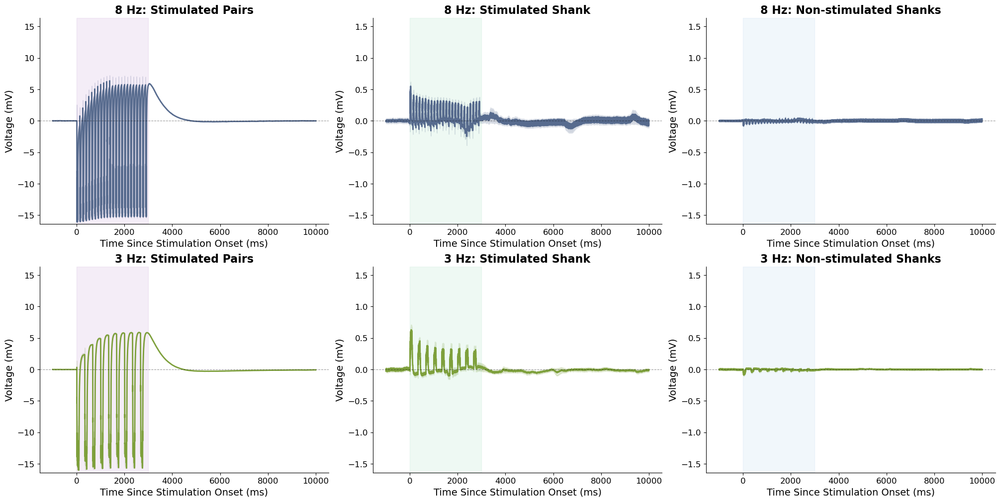

For fpulse = 3 Hz:
  - Cycle duration:       1/3   = 333.3 ms
  - Theta-burst duration: 0.25 × 333.3 = 83.3 ms
  - Total cycles in 3s:  3000 / 333.3 = 9 cycles

For fpulse = 8 Hz:
  - Cycle duration:       1/8   = 125.0 ms
  - Theta-burst duration: 0.25 × 125.0 = 31.3 ms
  - Total cycles in 3s:  3000 / 125.0 = 24 cycles


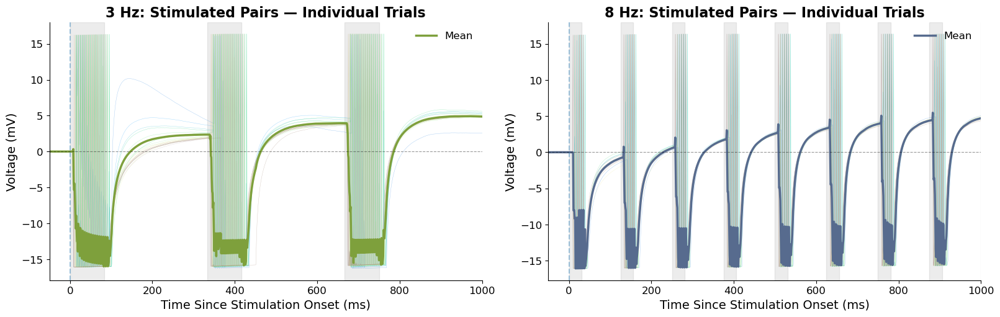

The first pulse onset should fall within ±20 ms of the stimulation onset marker.


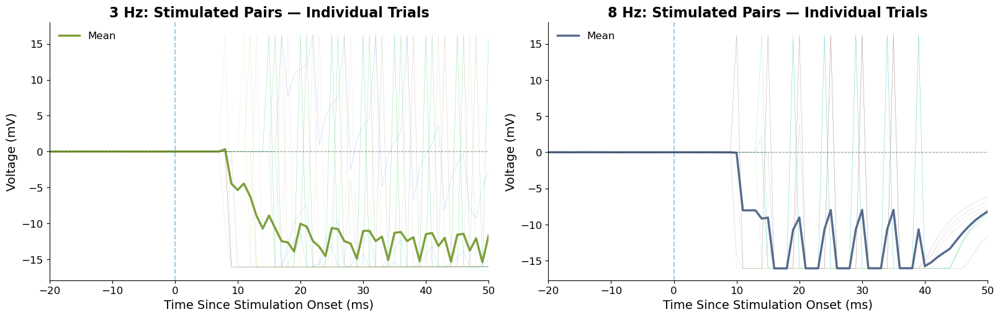

In [14]:
# =============================================================================
# CONFIGURATION
# =============================================================================
write_fig_path = "."
bad_channels = []
STIM_START, STIM_END = 0, 3000  # ms
FONTSIZE_TITLE = 16
FONTSIZE_LABEL = 14
FONTSIZE_TICK = 12

COLORS = {
    'stim_span': '#D5D8DC',
    '3hz':       '#7ea03c',
    '8hz':       '#576b8e',
    'col_0':     '#A66CBF',   # Stimulated Pairs  — purple
    'col_1':     '#7BCFA0',   # Stimulated Shank  — green
    'col_2':     '#8ebfe3',   # Non-stim Shanks   — blue
}

# ← reordered: Stimulated Pairs first, Shank second, Non-stim third
PLOT_CONFIG = [
    ('Stimulated Pairs',      'stimuli'),
    ('Stimulated Shank',      'channel'),
    ('Non-stimulated Shanks', 'other'),
]

UV_TO_MV = 1000


# =============================================================================
# HELPER FUNCTIONS
# =============================================================================
def style_ax(ax, title, col_color=None,
             xlabel='Time Since Stimulation Onset (ms)',
             ylabel='Voltage (mV)'):
    ax.set_title(title, fontsize=FONTSIZE_TITLE, fontweight='bold')
    ax.set_xlabel(xlabel, fontsize=FONTSIZE_LABEL)
    ax.set_ylabel(ylabel, fontsize=FONTSIZE_LABEL)
    ax.tick_params(labelsize=FONTSIZE_TICK)
    ax.axhline(y=0, color='k', linestyle='--', alpha=0.4, linewidth=0.8)
    stim_color = col_color if col_color is not None else COLORS['stim_span']
    ax.axvspan(STIM_START, STIM_END, alpha=0.12, color=stim_color)
    ax.spines[['top', 'right']].set_visible(False)


def compute_channel_averages(eeg, idx_other, idx_stimuli, idx_channel):
    return {
        'other':   np.mean(eeg[:, idx_other,   :], axis=1) * UV_TO_MV,
        'stimuli': np.mean(eeg[:, idx_stimuli, :], axis=1) * UV_TO_MV,
        'channel': np.mean(eeg[:, idx_channel, :], axis=1) * UV_TO_MV,
    }


def plot_stim_row(axes, time_axis, averages, freq_label, freq_color):
    # pair_peak driven by stimuli column as before
    pair_peak  = np.max(np.abs(averages['stimuli']))
    col_colors = [COLORS['col_0'], COLORS['col_1'], COLORS['col_2']]

    for ax, (title, data_key), col_color in zip(axes, PLOT_CONFIG, col_colors):
        mean_trace = np.mean(averages[data_key], axis=0)
        sem_trace  = np.std(averages[data_key],  axis=0) / np.sqrt(averages[data_key].shape[0])

        ax.plot(time_axis, mean_trace, linewidth=2, color=freq_color)
        ax.fill_between(time_axis,
                        mean_trace - sem_trace,
                        mean_trace + sem_trace,
                        color=freq_color, alpha=0.2)
        style_ax(ax, f'{freq_label}: {title}', col_color=col_color)
        # stimuli panel keeps full scale; others scaled to 1/10
        ylim = pair_peak if data_key == 'stimuli' else pair_peak / 10
        ax.set_ylim(-ylim, ylim)


def plot_individual_trials(ax, time_axis, trial_data, freq_label, freq_color,
                           xlim=(-20, 100)):
    n_trials = trial_data.shape[0]
    cmap = plt.cm.terrain(np.linspace(0.1, 0.9, n_trials))

    for i in range(n_trials):
        ax.plot(time_axis, trial_data[i], linewidth=0.3, alpha=0.4,
                color=cmap[i])

    ax.plot(time_axis, np.mean(trial_data, axis=0), linewidth=2.5,
            color=freq_color, label='Mean')
    ax.axvline(x=0, linestyle='--', alpha=0.4)
    ax.set_xlim(xlim)
    ax.legend(fontsize=FONTSIZE_TICK, frameon=False)
    ax.spines[['top', 'right']].set_visible(False)
    ax.set_title(f'{freq_label}: Stimulated Pairs — Individual Trials',
                 fontsize=FONTSIZE_TITLE, fontweight='bold')
    ax.set_xlabel('Time Since Stimulation Onset (ms)', fontsize=FONTSIZE_LABEL)
    ax.set_ylabel('Voltage (mV)', fontsize=FONTSIZE_LABEL)
    ax.tick_params(labelsize=FONTSIZE_TICK)
    ax.axhline(y=0, color='k', linestyle='--', alpha=0.4, linewidth=0.8)
    # ← NO axvspan here: no stim background in Figure 2


# =============================================================================
# FIGURE 1: 2×3 grid (8 Hz top row, 3 Hz bottom row)
# =============================================================================

print(
    "Stimulated Pairs: the specific contacts delivering stimulation.\n"
    "Stimulated Shank: all other contacts on the same electrode shank, "
    "excluding the stimulated contacts.\n"
    "Non-stimulated Shanks: contacts on all remaining shanks."
)

fig, axes = plt.subplots(2, 3, figsize=(20, 10), constrained_layout=True)

if Contact_stimuli_8:
    avg_8 = compute_channel_averages(eeg_8HZ, Index_other_8,
                                     Contact_stimuli_8, Channel_stimuli_8)
    plot_stim_row(axes[0], time_axis, avg_8, '8 Hz', COLORS['8hz'])

if Contact_stimuli_3:
    avg_3 = compute_channel_averages(eeg_3HZ, Index_other_3,
                                     Contact_stimuli_3, Channel_stimuli_3)
    plot_stim_row(axes[1], time_axis, avg_3, '3 Hz', COLORS['3hz'])

fig.savefig(f"{write_fig_path}/2x3_plot.pdf", transparent=True,
            bbox_inches='tight', pad_inches=0.08, format='pdf')
plt.show()


# =============================================================================
# FIGURE 2: Individual trials — wide view (1×2)
# =============================================================================
print(
    "For fpulse = 3 Hz:\n"
    "  - Cycle duration:       1/3   = 333.3 ms\n"
    "  - Theta-burst duration: 0.25 × 333.3 = 83.3 ms\n"
    "  - Total cycles in 3s:  3000 / 333.3 = 9 cycles\n"
    "\n"
    "For fpulse = 8 Hz:\n"
    "  - Cycle duration:       1/8   = 125.0 ms\n"
    "  - Theta-burst duration: 0.25 × 125.0 = 31.3 ms\n"
    "  - Total cycles in 3s:  3000 / 125.0 = 24 cycles"
)

fig, (ax_left, ax_right) = plt.subplots(1, 2, figsize=(16, 5),
                                         constrained_layout=True)

if Contact_stimuli_3:
    plot_individual_trials(ax_left, time_axis, avg_3['stimuli'],
                           '3 Hz', COLORS['3hz'], xlim=(-50, 1000))
    cycle_dur = 1000 / 3
    burst_dur = 0.25 * cycle_dur
    for i in range(int(1000 / cycle_dur) + 1):
        onset = i * cycle_dur
        if onset + burst_dur <= 1050:
            ax_left.axvspan(onset, onset + burst_dur, alpha=0.15, color='grey')

if Contact_stimuli_8:
    plot_individual_trials(ax_right, time_axis, avg_8['stimuli'],
                           '8 Hz', COLORS['8hz'], xlim=(-50, 1000))
    cycle_dur = 1000 / 8
    burst_dur = 0.25 * cycle_dur
    for i in range(int(1000 / cycle_dur) + 1):
        onset = i * cycle_dur
        if onset + burst_dur <= 1050:
            ax_right.axvspan(onset, onset + burst_dur, alpha=0.15, color='grey')

fig.savefig(f"{write_fig_path}/individual_trials_3Hz_8Hz.pdf",
            transparent=True, bbox_inches='tight', pad_inches=0.08,
            format='pdf')
plt.show()


# =============================================================================
# FIGURE 2 (zoom-in): first pulse onset check
# =============================================================================
print(
    "The first pulse onset should fall within ±20 ms of the stimulation onset marker."
)

fig, (ax_left, ax_right) = plt.subplots(1, 2, figsize=(16, 5),
                                         constrained_layout=True)

if Contact_stimuli_3:
    plot_individual_trials(ax_left, time_axis, avg_3['stimuli'],
                           '3 Hz', COLORS['3hz'], xlim=(-20, 50))

if Contact_stimuli_8:
    plot_individual_trials(ax_right, time_axis, avg_8['stimuli'],
                           '8 Hz', COLORS['8hz'], xlim=(-20, 50))

fig.savefig(f"{write_fig_path}/individual_trials_3Hz_8Hz_zoomin.pdf",
            transparent=True, bbox_inches='tight', pad_inches=0.08,
            format='pdf')
plt.show()

In [15]:
# =============================================================================
# PRINT AVERAGE VOLTAGE STATISTICS
# =============================================================================
print("Average Voltage Summary")
print("=" * 50)

def print_voltage_stats(avg, freq_label):
    print(f"\n{freq_label}")
    print("-" * 40)
    for data_key, display_name in [
        ('stimuli', 'Stimulated Pairs'),
        ('channel', 'Stimulated Shank'),
        ('other',   'Non-stimulated Shanks'),
    ]:
        data = avg[data_key]                         # shape: (n_trials, n_timepoints)
        mean_trace  = np.mean(data, axis=0)          # (n_timepoints,)
        trial_means = np.mean(np.abs(data), axis=1)  # (n_trials,) — per-trial mean abs voltage

        print(f"  {display_name}:")
        print(f"    N trials          : {data.shape[0]}")
        print(f"    Mean voltage (µV) : {np.mean(mean_trace):.4f}")
        print(f"    Mean |voltage| (µV): {np.mean(trial_means):.4f}")
        print(f"    Peak |voltage| (µV): {np.max(np.abs(mean_trace)):.4f}")
        print(f"    Std across trials : {np.std(trial_means):.4f}")

if Contact_stimuli_8:
    print_voltage_stats(avg_8, '8 Hz')

if Contact_stimuli_3:
    print_voltage_stats(avg_3, '3 Hz')

print("\n" + "=" * 50)

Average Voltage Summary

8 Hz
----------------------------------------
  Stimulated Pairs:
    N trials          : 12
    Mean voltage (µV) : -0.0075
    Mean |voltage| (µV): 2.1293
    Peak |voltage| (µV): 16.0789
    Std across trials : 0.0449
  Stimulated Shank:
    N trials          : 12
    Mean voltage (µV) : 0.0072
    Mean |voltage| (µV): 0.1192
    Peak |voltage| (µV): 0.5506
    Std across trials : 0.0285
  Non-stimulated Shanks:
    N trials          : 12
    Mean voltage (µV) : -0.0010
    Mean |voltage| (µV): 0.0404
    Peak |voltage| (µV): 0.0813
    Std across trials : 0.0033

3 Hz
----------------------------------------
  Stimulated Pairs:
    N trials          : 18
    Mean voltage (µV) : 0.0117
    Mean |voltage| (µV): 2.3397
    Peak |voltage| (µV): 15.9968
    Std across trials : 0.0784
  Stimulated Shank:
    N trials          : 18
    Mean voltage (µV) : 0.0037
    Mean |voltage| (µV): 0.1127
    Peak |voltage| (µV): 0.6294
    Std across trials : 0.0282
  Non-st

In [16]:
display(Markdown("""
### 3.2 Retrieval Stimulation Response
"""))


### 3.2 Retrieval Stimulation Response



This cell repeats the encoding stimulation visualization (Section 3.1) for the retrieval phase, where stimulation is delivered in 3-second on/off trains during the free-recall period. The extracted epoch window is the same as encoding (−1 to +10 s), but a second shaded region at 6000–9000 ms marks the second stimulation interval expected during the recall period.


Stimulated Pairs: the specific contacts delivering stimulation.
Stimulated Shank: all other contacts on the same electrode shank, excluding the stimulated contacts.
Non-stimulated Shanks: contacts on all remaining shanks.


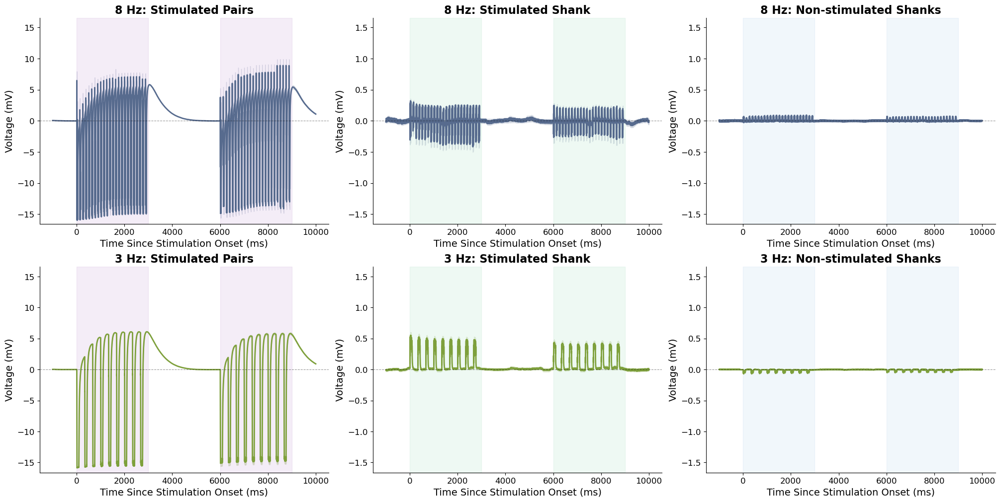

For fpulse = 3 Hz:
  - Cycle duration:       1/3   = 333.3 ms
  - Theta-burst duration: 0.25 × 333.3 = 83.3 ms
  - Total cycles in 3s:  3000 / 333.3 = 9 cycles

For fpulse = 8 Hz:
  - Cycle duration:       1/8   = 125.0 ms
  - Theta-burst duration: 0.25 × 125.0 = 31.3 ms
  - Total cycles in 3s:  3000 / 125.0 = 24 cycles


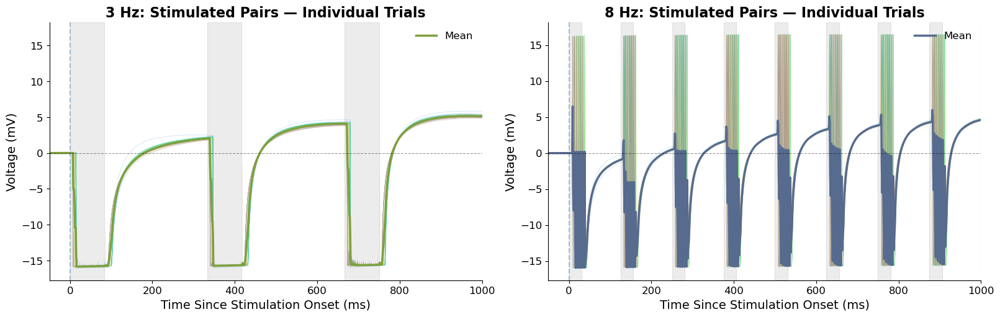

The first pulse onset should fall within ±20 ms of the stimulation onset marker.


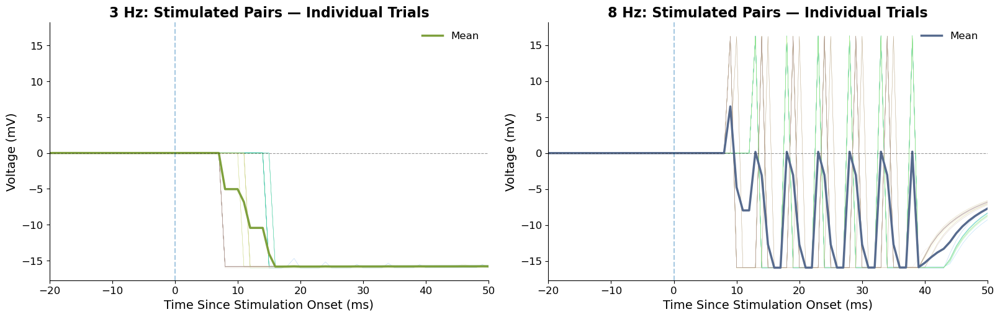

In [17]:

bed_channel = []
channel = [i for i in range(np.shape(eeg_8HZ_retrieval)[1]) if i not in bed_channel]

Index_other_8, Channel_stimuli_8, Contact_stimuli_8 = identify_stimulated_channels(
    result_8HZ_retrieval, channel_info)
Index_other_3, Channel_stimuli_3, Contact_stimuli_3 = identify_stimulated_channels(
    result_3HZ_retrieval, channel_info)

total_samples = eeg_8HZ_retrieval.shape[2]
time_window   = 10000
time_axis     = np.linspace(-1000, time_window, total_samples)

print(
    "Stimulated Pairs: the specific contacts delivering stimulation.\n"
    "Stimulated Shank: all other contacts on the same electrode shank, "
    "excluding the stimulated contacts.\n"
    "Non-stimulated Shanks: contacts on all remaining shanks."
)

# =============================================================================
# FIGURE 1: 2×3 grid (8 Hz top row, 3 Hz bottom row)
# =============================================================================
fig, axes = plt.subplots(2, 3, figsize=(20, 10), constrained_layout=True)

if Contact_stimuli_8:
    avg_8 = compute_channel_averages(eeg_8HZ_retrieval, Index_other_8,
                                     Contact_stimuli_8, Channel_stimuli_8)
    plot_stim_row(axes[0], time_axis, avg_8, '8 Hz', COLORS['8hz'])

if Contact_stimuli_3:
    avg_3 = compute_channel_averages(eeg_3HZ_retrieval, Index_other_3,
                                     Contact_stimuli_3, Channel_stimuli_3)
    plot_stim_row(axes[1], time_axis, avg_3, '3 Hz', COLORS['3hz'])

# Second stim window (6000–9000 ms) — per-column color matches col_colors order
col_colors = [COLORS['col_0'], COLORS['col_1'], COLORS['col_2']]
for ax, col_color in zip(axes.flat, col_colors * 2):   # 2 rows × 3 cols
    ax.axvspan(6000, 9000, alpha=0.12, color=col_color)

fig.savefig(f"{write_fig_path}/2x3_plot_retrieval.pdf", transparent=True,
            bbox_inches='tight', pad_inches=0.08, format='pdf')
plt.show()

# =============================================================================
# FIGURE 2: Individual trials — wide view (1×2)
# =============================================================================
print(
    "For fpulse = 3 Hz:\n"
    "  - Cycle duration:       1/3   = 333.3 ms\n"
    "  - Theta-burst duration: 0.25 × 333.3 = 83.3 ms\n"
    "  - Total cycles in 3s:  3000 / 333.3 = 9 cycles\n"
    "\n"
    "For fpulse = 8 Hz:\n"
    "  - Cycle duration:       1/8   = 125.0 ms\n"
    "  - Theta-burst duration: 0.25 × 125.0 = 31.3 ms\n"
    "  - Total cycles in 3s:  3000 / 125.0 = 24 cycles"
)

fig, (ax_left, ax_right) = plt.subplots(1, 2, figsize=(16, 5),
                                         constrained_layout=True)

if Contact_stimuli_3:
    plot_individual_trials(ax_left, time_axis, avg_3['stimuli'],
                           '3 Hz', COLORS['3hz'], xlim=(-50, 1000))
    cycle_dur = 1000 / 3
    burst_dur = 0.25 * cycle_dur
    for i in range(int(1000 / cycle_dur) + 1):
        onset = i * cycle_dur
        if onset + burst_dur <= 1050:
            ax_left.axvspan(onset, onset + burst_dur, alpha=0.15, color='grey')

if Contact_stimuli_8:
    plot_individual_trials(ax_right, time_axis, avg_8['stimuli'],
                           '8 Hz', COLORS['8hz'], xlim=(-50, 1000))
    cycle_dur = 1000 / 8
    burst_dur = 0.25 * cycle_dur
    for i in range(int(1000 / cycle_dur) + 1):
        onset = i * cycle_dur
        if onset + burst_dur <= 1050:
            ax_right.axvspan(onset, onset + burst_dur, alpha=0.15, color='grey')

fig.savefig(f"{write_fig_path}/individual_trials_3Hz_8Hz_retrieval.pdf",
            transparent=True, bbox_inches='tight', pad_inches=0.08,
            format='pdf')
plt.show()

# =============================================================================
# FIGURE 2 (zoom-in): first pulse onset check
# =============================================================================
print(
    "The first pulse onset should fall within ±20 ms of the stimulation onset marker."
)

fig, (ax_left, ax_right) = plt.subplots(1, 2, figsize=(16, 5),
                                         constrained_layout=True)

if Contact_stimuli_3:
    plot_individual_trials(ax_left, time_axis, avg_3['stimuli'],
                           '3 Hz', COLORS['3hz'], xlim=(-20, 50))

if Contact_stimuli_8:
    plot_individual_trials(ax_right, time_axis, avg_8['stimuli'],
                           '8 Hz', COLORS['8hz'], xlim=(-20, 50))

fig.savefig(f"{write_fig_path}/individual_trials_3Hz_8Hz_retrieval_zoomin.pdf",
            transparent=True, bbox_inches='tight', pad_inches=0.08,
            format='pdf')
plt.show()

In [18]:
display(Markdown("""
### 3.3 Per-Trial Stimulation Artifact
"""))


### 3.3 Per-Trial Stimulation Artifact


This section provides a trial-by-trial view, as seen from the stimulated contact pair, zoomed to the second stimulation burst window (950–2050 ms). This is distinct from the earlier Figure 2 (Section 3.2), which showed the first burst.

**Purpose:** Confirm that stimulation artifacts are consistent across trials. Trial-to-trial variability in artifact amplitude or timing can indicate:
- Changes in electrode impedance across the session
- Hardware triggering inconsistency

Each subplot shows the contact-pair-averaged voltage for a single trial. The black dashed line at 0 ms marks stimulation onset; the red dashed line at 1000 ms marks the end of the first cycle.

**Cell 15 — 3 Hz condition:** `avg_eeg_stimuli_3 = mean(eeg_3HZ[:, Contact_stimuli_3, :], axis=1)` → shape `(n_trials, n_timepoints)`.

**Cell 16 — 8 Hz condition:** Same procedure for the 8 Hz epochs.

> ⚠️ **QC flag:** Look for trials that show markedly different artifact morphology


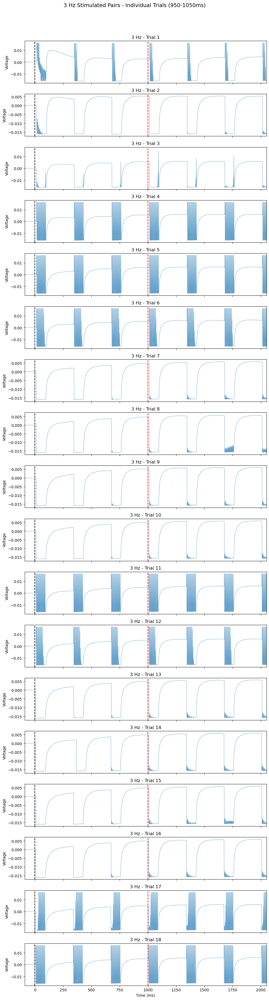

In [19]:
# 3 Hz Stimulated Pairs - Individual Trials in Subplots
avg_eeg_stimuli_3 = np.mean(eeg_3HZ[:, Contact_stimuli_3, :], axis=1)
num_trials_3hz = avg_eeg_stimuli_3.shape[0]
fig, axes = plt.subplots(num_trials_3hz, 1, figsize=(10, 2*num_trials_3hz), sharex=True)

# Handle case where there's only one trial
if num_trials_3hz == 1:
    axes = [axes]

for i in range(num_trials_3hz):
    axes[i].plot(time_axis, avg_eeg_stimuli_3[i, :], linewidth=0.5)
    axes[i].axvline(x=0, color='k', linestyle='--')
    axes[i].axvline(x=1000, color='r', linestyle='--')
    axes[i].set_xlim(-90, 2050)
    axes[i].set_ylabel('Voltage')
    axes[i].set_title(f'3 Hz - Trial {i+1}')

axes[-1].set_xlabel('Time (ms)')
plt.suptitle(
    '3 Hz Stimulated Pairs - Individual Trials (950-1050ms)',
    fontsize=14,
    y=1.02
)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.tight_layout()
plt.savefig('single_3.pdf', format='pdf', dpi=300, bbox_inches='tight')
plt.show()


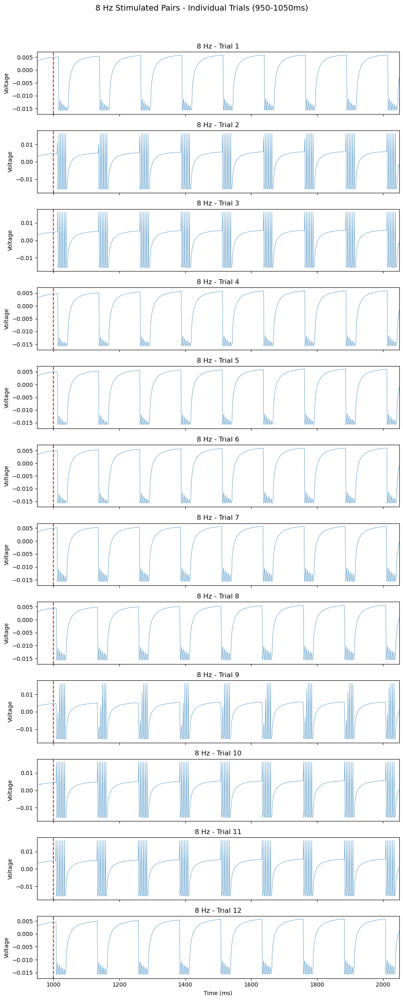

In [20]:
avg_eeg_stimuli_8 = np.mean(eeg_8HZ[:, Contact_stimuli_8, :], axis=1)
num_trials_8hz = avg_eeg_stimuli_8.shape[0]
fig, axes = plt.subplots(num_trials_8hz, 1, figsize=(10, 2*num_trials_8hz), sharex=True)

# Handle case where there's only one trial


for i in range(num_trials_8hz):
    axes[i].plot(time_axis, avg_eeg_stimuli_8[i, :], linewidth=0.5)
    axes[i].axvline(x=0, color='k', linestyle='--')
    axes[i].axvline(x=1000, color='r', linestyle='--')
    axes[i].set_xlim(950, 2050)
    axes[i].set_ylabel('Voltage')
    axes[i].set_title(f'8 Hz - Trial {i+1}')

axes[-1].set_xlabel('Time (ms)')
plt.suptitle(
    '8 Hz Stimulated Pairs - Individual Trials (950-1050ms)',
    fontsize=14,
    y=1.02
)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.tight_layout()
plt.savefig('single_8.pdf', format='pdf', dpi=300, bbox_inches='tight')
plt.show()


In [21]:
display(Markdown("""
## Module 4: Channel Integrity and Artifact Assessment


"""))


## Module 4: Channel Integrity and Artifact Assessment




---

This module implements automated channel-quality screening using line-noise detection and two complementary variability-based metrics

The channel QC module addresses the challenge of identifying recording artifacts, high-impedance contacts, and electrical interference to prevent contamination of downstream spectral or connectivity analyses.



In [22]:
display(Markdown("""
### 4.1 Trial-to-Trial Variability
"""))


### 4.1 Trial-to-Trial Variability



**Principle:** For each channel, this method computes variability across trials at each timepoint and then averages across time.

**Procedure:**
1. `trial_variability = np.std(eeg_no_encoding[:, channel, :], axis=0)` → shape `(n_channels, n_timepoints)` — for each channel and timepoint, this measures how much voltage varies across trials.
2. `channel_variability = np.mean(trial_variability, axis=1)` → shape `(n_channels,)` — the time-averaged cross-trial std per channel.
3. Z-score across channels; flag `|z| > 2` as outliers.

**4-panel diagnostic figure:**
- **Panel A (Heatmap):** Trial variability as a function of time and channel — helps visualize whether variability spikes are time-locked (suggesting an artifact aligned to task events) or channel-specific (suggesting a noisy electrode).
- **Panel B:** Mean variability across channels over time — shows whether overall noise increases during specific task phases.
- **Panel C:** Channel z-scores — the ±2 dashed lines reflect the flagging threshold.
- **Panel D:** Trial-averaged traces for the top flagged channels — visual confirmation of whether flagged channels have drift, high-frequency noise, or burst activity.


------------------------------
Total channels analyzed: 124
Channels with high variability (|z-score| > 2): 6

Potential problematic channels:
  Channel 52: LOP7-LOP8 (z-score: 4.73)
  Channel 55: LOP10-LOP11 (z-score: 4.83)
  Channel 81: LIA3-LIA4 (z-score: 4.50)
  Channel 82: LIA4-LIA5 (z-score: 4.50)
  Channel 93: LR8-LR9 (z-score: 2.58)
  Channel 107: LIM4-LIM5 (z-score: 2.49)


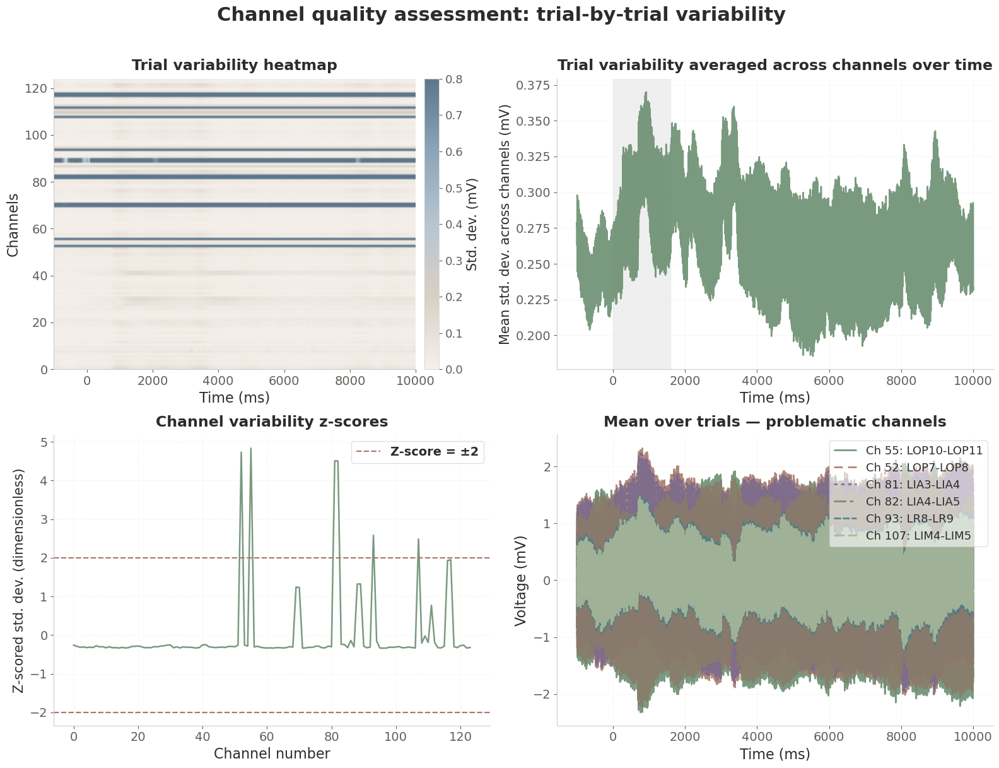

In [23]:
from scipy.stats import zscore
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.colors import LinearSegmentedColormap



bad_channels = []
channel = [i for i in range(np.shape(eeg_8HZ)[1]) if i not in bad_channels]
channels = channel_info['name']
print("-" * 30)

# ── Rescale V → mV FIRST, then compute all statistics ──────────────
eeg_no_encoding_mV = eeg_no_encoding * 1e3                               # V → mV

trial_variability     = np.std(eeg_no_encoding_mV[:, channel, :], axis=0)   # (n_ch, n_t), mV
timepoint_variability = np.mean(trial_variability, axis=0)                   # (n_t,),      mV
channel_variability   = np.mean(trial_variability, axis=1)                   # (n_ch,),     mV
channel_variability_z = zscore(channel_variability)                          # dimensionless

problematic_channels = np.where(np.abs(channel_variability_z) > 2)[0]
print(f"Total channels analyzed: {len(channels)}")
print(f"Channels with high variability (|z-score| > 2): {len(problematic_channels)}")
if len(problematic_channels) > 0:
    print("\nPotential problematic channels:")
    for ch_idx in problematic_channels:
        if ch_idx < len(channels):
            print(f"  Channel {ch_idx}: {channels.iloc[ch_idx]} "
                  f"(z-score: {channel_variability_z[ch_idx]:.2f})")

# =============================================================================
# Color style
# =============================================================================

plt.rcParams.update({
    'figure.facecolor':  'white',
    'axes.facecolor':    'white',
    'axes.edgecolor':    '#CCCCCC',
    'axes.labelcolor':   '#2C2C2A',
    'axes.titlecolor':   '#2C2C2A',
    'xtick.color':       '#5F5E5A',
    'ytick.color':       '#5F5E5A',
    'grid.color':        '#E8E6E2',
    'grid.linestyle':    '--',
    'grid.linewidth':    0.6,
    'text.color':        '#2C2C2A',
    'font.family':       'sans-serif',
    'axes.spines.top':   False,
    'axes.spines.right': False,
    'axes.spines.left':  True,
    'axes.spines.bottom':True,
})

# Method 1 palette (sage green family)
LINE_COLOR   = '#6B8F71'    # sage green   — Panels B & C main line
ZSCORE_COLOR = '#A67B6D'    # terracotta   — ±2 threshold lines
STIM_COLOR   = '#D6C9B6'    # warm beige   — stimulus window shading

# morandi_seq heatmap: light cream → teal-grey
morandi_seq = LinearSegmentedColormap.from_list(
    'morandi_seq',
    ['#F5F0EB', '#D8D0C5', '#B8C5CF', '#8DA5B8', '#5E768A']
)

# Morandi PROB_COLORS for problematic channel traces
PROB_COLORS = [
    '#6B8F71',  # sage green
    '#A67B6D',  # terracotta
    '#7B6B8F',  # dusty violet
    '#8A7B6A',  # warm taupe
    '#4F7E85',  # steel teal
    '#A8B89A',  # pale sage
    '#C4A99A',  # rose-beige
    '#C0B4CC',  # pale violet
]

# =============================================================================
# 2×2 Channel Quality Assessment
# =============================================================================
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.patch.set_facecolor('white')
fig.suptitle('Channel quality assessment: trial-by-trial variability',
             fontsize=22, fontweight='bold', color='#2C2C2A', y=1.01)

# ── Panel A: Heatmap ────────────────────────────────────────────────
ax1 = axes[0, 0]
im = ax1.imshow(
    trial_variability,
    aspect='auto',
    cmap=morandi_seq,
    origin='lower',
    extent=[time_axis[0], time_axis[-1], 0, trial_variability.shape[0]],
    vmin=0.0,
    vmax=0.8
)
ax1.set_xlabel('Time (ms)', fontsize=16)
ax1.set_ylabel('Channels', fontsize=16)
ax1.set_title('Trial variability heatmap', fontsize=17,fontweight='bold',pad=10)
ax1.tick_params(axis='both', labelsize=14)
cbar = plt.colorbar(im, ax=ax1, pad=0.02)
cbar.set_label('Std. dev. (mV)', fontsize=15)
cbar.ax.tick_params(labelsize=13)
cbar.outline.set_edgecolor('#CCCCCC')
cbar.outline.set_linewidth(0.5)

# ── Panel B: Timepoint variability averaged across channels ─────────
# Item presentation window for encoding-word-aligned epochs
ITEM_START_MS = 0
ITEM_END_MS = 1600
ITEM_COLOR = "lightgrey"
ITEM_ALPHA = 0.35
ax2 = axes[0, 1]
ax2.plot(time_axis, timepoint_variability, color=LINE_COLOR, linewidth=1.8, alpha=0.9)
ax2.set_xlabel('Time (ms)', fontsize=16)
ax2.set_ylabel('Mean std. dev. across channels (mV)', fontsize=15)
ax2.set_title('Trial variability averaged across channels over time', fontsize=17, fontweight='bold', pad=10)
ax2.grid(True, alpha=0.5)
ax2.axvspan(
    ITEM_START_MS,
    ITEM_END_MS,
    alpha=ITEM_ALPHA,
    color=ITEM_COLOR,
    zorder=0,
)
ax2.tick_params(axis='both', labelsize=14)

# ── Panel C: Channel variability z-scores ───────────────────────────
ax3 = axes[1, 0]
ax3.plot(channel_variability_z, color=LINE_COLOR, linewidth=1.8, alpha=0.9)
ax3.axhline(y= 2, color=ZSCORE_COLOR, linestyle='--', linewidth=1.6, label='Z-score = ±2')
ax3.axhline(y=-2, color=ZSCORE_COLOR, linestyle='--', linewidth=1.6)
ax3.set_xlabel('Channel number', fontsize=16)
ax3.set_ylabel('Z-scored std. dev. (dimensionless)', fontsize=15)
ax3.set_title('Channel variability z-scores', fontsize=17, fontweight='bold', pad=10)
ax3.grid(True, alpha=0.5)
ax3.legend(fontsize=14, framealpha=0.6, edgecolor='#CCCCCC',
           prop={'size': 14, 'weight': 'bold'})
ax3.tick_params(axis='both', labelsize=14)

# ── Panel D: Problematic channels mean voltage over time ────────────
ax4 = axes[1, 1]
if len(problematic_channels) > 0:
    problematic_sorted = problematic_channels[
        np.argsort(-channel_variability_z[problematic_channels])
    ]
    DASH_STYLES = [
        (0, ()),           # solid
        (0, (5, 3)),       # dashed
        (0, (2, 2)),       # dotted
        (0, (7, 2, 2, 2)), # dash-dot
        (0, (4, 1)),
        (0, (6, 2)),
        (0, (3, 1, 1, 1)),
        (0, (8, 3)),
    ]
    for i, ch in enumerate(problematic_sorted[:8]):
        if ch < trial_variability.shape[0]:
            ch_name = channels.iloc[ch] if ch < len(channels) else 'unknown'
            ax4.plot(
                time_axis,
                np.mean(eeg_no_encoding_mV[:, ch, :], axis=0),
                color=PROB_COLORS[i % len(PROB_COLORS)],
                linestyle=DASH_STYLES[i % len(DASH_STYLES)],
                label=f'Ch {ch}: {ch_name}',
                linewidth=2.0,
                alpha=0.9
            )
ax4.set_xlabel('Time (ms)', fontsize=16)
ax4.set_ylabel('Voltage (mV)', fontsize=16)
ax4.set_title('Mean over trials — problematic channels', fontsize=17, fontweight='bold', pad=10)
ax4.grid(True, alpha=0.5)
ax4.legend(fontsize=13, framealpha=0.6, edgecolor='#CCCCCC', loc='upper right',
           prop={'size': 13})
#ax4.axvspan(stim_start_time, stim_end_time, alpha=0.35, color=STIM_COLOR, zorder=0)
ax4.tick_params(axis='both', labelsize=14)

plt.tight_layout(rect=[0, 0, 1, 0.99])
plt.savefig(f"{write_fig_path}/2x2_Maps_ex.pdf",
            transparent=False, bbox_inches='tight',
            pad_inches=0.08, format='pdf')
plt.show()

In [24]:
display(Markdown("""
### 4.2 Temporal Variability
"""))


### 4.2 Temporal Variability




**Principle:** Rather than measuring variability across trials, this method measures variability over time within each trial and then averages across trials. This captures a complementary failure mode: channels with excessive within-trial signal fluctuations, even when the signal appears relatively consistent from trial to trial.

**Procedure:**
1. `temporal_variability = np.std(eeg_no_encoding[:, channel, :], axis=2)` → shape `(n_trials, n_channels)` — for each trial and channel, this measures how much voltage varies over time.
2. `channel_temporal_variability = np.mean(temporal_variability, axis=0)` → shape `(n_channels,)` — average temporal variability across trials.
3. Z-score across channels and flag channels with `|z| > 2`.

The two metrics are **complementary**:
- High **trial-to-trial variability** → inconsistent responses across trials, which may indicate intermittent artifact.
- High **temporal variability** → excessive within-trial signal fluctuation, which may indicate persistent broadband noise, slow drift, poor contact, or continuous artifact.

The 4-panel figure structure mirrors Section 4.1, enabling direct comparison between the two variability metrics.


  Total channels analyzed : 124
  Flagged (|z| > 2)       : 6
  Flagged channels:
    Ch  55: LOP10-LOP11          z = 4.96
    Ch  52: LOP7-LOP8            z = 4.85
    Ch  81: LIA3-LIA4            z = 4.62
    Ch  82: LIA4-LIA5            z = 4.61
    Ch  93: LR8-LR9              z = 2.57
    Ch 107: LIM4-LIM5            z = 2.46


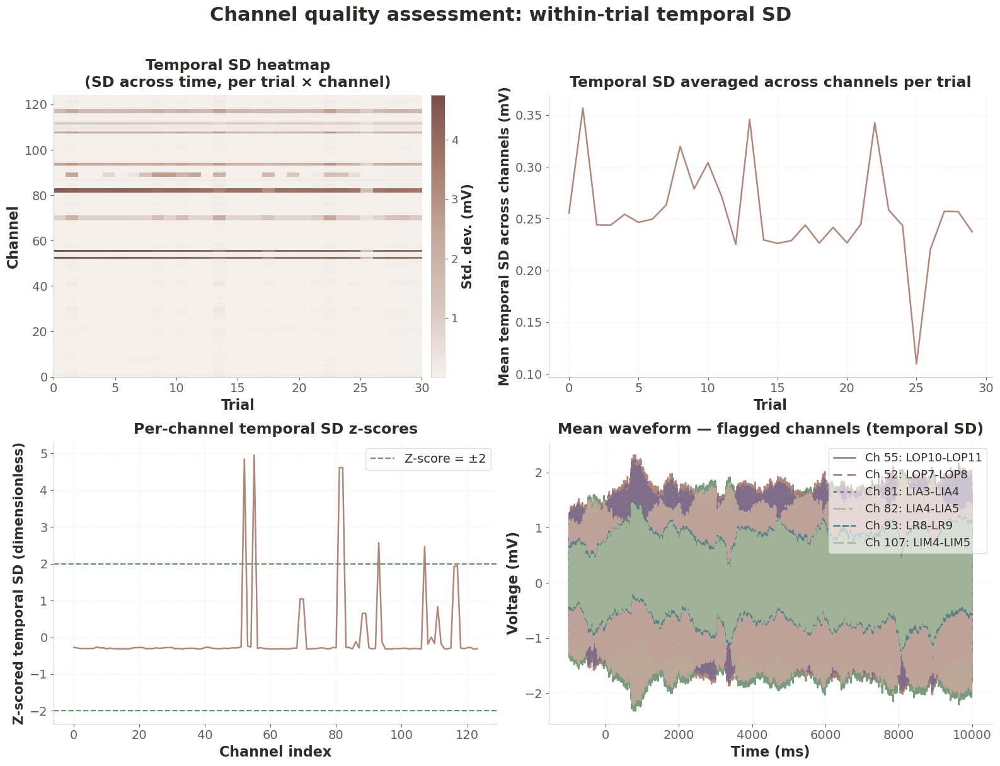

SUMMARY
  Flagged by trial variability only : 0
  Flagged by temporal variability only : 0
  Flagged by BOTH methods           : 6
  Total unique flagged channels     : 6
  Channels flagged by both:
    Ch  52: LOP7-LOP8            trial-z = 4.73, temporal-z = 4.85
    Ch  55: LOP10-LOP11          trial-z = 4.83, temporal-z = 4.96
    Ch  81: LIA3-LIA4            trial-z = 4.50, temporal-z = 4.62
    Ch  82: LIA4-LIA5            trial-z = 4.50, temporal-z = 4.61
    Ch  93: LR8-LR9              trial-z = 2.58, temporal-z = 2.57
    Ch 107: LIM4-LIM5            trial-z = 2.49, temporal-z = 2.46


In [25]:
# For each trial × channel, compute variability over time.
# High values indicate excessive within-trial signal fluctuation.

# eeg_no_encoding_mV shape: (n_trials, n_ch_full, n_t) — filter to valid channels first
eeg_filt_mV = eeg_no_encoding_mV[:, channel, :]                  # (n_trials, n_ch, n_t)

# (n_trials, n_ch): SD across time within each trial × channel
temporal_sd = np.std(eeg_filt_mV, axis=2)                        # mV

# (n_trials,): average temporal variability over channels → identifies globally noisy trials
temporal_sd_avg_over_ch = np.mean(temporal_sd, axis=1)

# (n_ch,): average temporal variability over trials → one scalar per channel
channel_temporal_sd   = np.mean(temporal_sd, axis=0)
channel_temporal_sd_z = zscore(channel_temporal_sd)

problematic_temporal = np.where(np.abs(channel_temporal_sd_z) > 2)[0]
problematic_temporal_sorted = (
    problematic_temporal[np.argsort(-channel_temporal_sd_z[problematic_temporal])]
    if len(problematic_temporal) > 0 else np.array([])
)


print(f"  Total channels analyzed : {len(channel)}")
print(f"  Flagged (|z| > 2)       : {len(problematic_temporal)}")
if len(problematic_temporal) > 0:
    print("  Flagged channels:")
    for ch_idx in problematic_temporal_sorted:
        orig_ch = channel[ch_idx]
        ch_name = channels.iloc[orig_ch] if orig_ch < len(channels) else 'unknown'
        print(f"    Ch {orig_ch:>3}: {ch_name:<20} "
              f"z = {channel_temporal_sd_z[ch_idx]:.2f}")

# =============================================================================
# Color style  (Method 2 — terracotta family)
# =============================================================================

plt.rcParams.update({
    'figure.facecolor':  'white',
    'axes.facecolor':    'white',
    'axes.edgecolor':    '#CCCCCC',
    'axes.labelcolor':   '#2C2C2A',
    'axes.titlecolor':   '#2C2C2A',
    'xtick.color':       '#5F5E5A',
    'ytick.color':       '#5F5E5A',
    'grid.color':        '#E8E6E2',
    'grid.linestyle':    '--',
    'grid.linewidth':    0.6,
    'text.color':        '#2C2C2A',
    'font.family':       'sans-serif',
    'axes.spines.top':   False,
    'axes.spines.right': False,
    'axes.spines.left':  True,
    'axes.spines.bottom':True,
})

LINE_COLOR2   = '#A67B6D'    # terracotta  — Method 2 line color (panels B & C)
ZSCORE_COLOR2 = '#6B8F71'    # sage green  — ±2 threshold lines
STIM_COLOR    = '#D6C9B6'    # warm beige  — stimulus window shading

from matplotlib.colors import LinearSegmentedColormap
morandi_seq2 = LinearSegmentedColormap.from_list(
    'morandi_seq2',
    ['#F5F0EB', '#D8C5BF', '#C4A99A', '#A67B6D', '#7A4F48']
)

PROB_COLORS = [
    '#6B8F71',  # sage green
    '#A67B6D',  # terracotta
    '#7B6B8F',  # dusty violet
    '#C4A99A',#C4A99A,  # warm taupe
    '#4F7E85',  # steel teal
    '#A8B89A',  # pale sage
    '#8A7B6A',  # rose-beige
    '#C0B4CC',  # pale violet
]

DASH_STYLES = [
    (0, ()),
    (0, (5, 3)),
    (0, (2, 2)),
    (0, (7, 2, 2, 2)),
    (0, (4, 1)),
    (0, (6, 2)),
    (0, (3, 1, 1, 1)),
    (0, (8, 3)),
]

# =============================================================================
# Figure — Temporal Variability
# =============================================================================

fig2, axes2 = plt.subplots(2, 2, figsize=(16, 12))
fig2.patch.set_facecolor('white')
fig2.suptitle('Channel quality assessment: within-trial temporal SD',
              fontsize=22, fontweight='bold', color='#2C2C2A', y=1.01)

# ── Panel A: Heatmap (n_ch × n_trials) ──────────────────────────────
ax = axes2[0, 0]
im = ax.imshow(
    temporal_sd.T,                         # transpose → (n_ch, n_trials)
    aspect='auto',
    cmap=morandi_seq2,
    origin='lower',
    extent=[0, temporal_sd.shape[0], 0, temporal_sd.shape[1]]
)
ax.set_xlabel('Trial', fontsize=16, fontweight='bold')
ax.set_ylabel('Channel', fontsize=16, fontweight='bold')
ax.set_title('Temporal SD heatmap\n(SD across time, per trial × channel)',
             fontsize=17, fontweight='bold', pad=10)
ax.tick_params(axis='both', labelsize=14)
cbar = plt.colorbar(im, ax=ax, pad=0.02)
cbar.set_label('Std. dev. (mV)', fontsize=15, fontweight='bold')
cbar.ax.tick_params(labelsize=13)
cbar.outline.set_edgecolor('#CCCCCC')
cbar.outline.set_linewidth(0.5)

# ── Panel B: Average temporal variability over channels, per trial ──
ax = axes2[0, 1]
ax.plot(np.arange(len(temporal_sd_avg_over_ch)), temporal_sd_avg_over_ch,
        color=LINE_COLOR2, linewidth=1.8, alpha=0.9)
ax.set_xlabel('Trial', fontsize=16, fontweight='bold')
ax.set_ylabel('Mean temporal SD across channels (mV)', fontsize=15, fontweight='bold')
ax.set_title('Temporal SD averaged across channels per trial',
             fontsize=17, fontweight='bold', pad=10)
ax.grid(True, alpha=0.5)
ax.tick_params(axis='both', labelsize=14)

# ── Panel C: Per-channel z-scores ────────────────────────────────────
ax = axes2[1, 0]
ax.plot(channel_temporal_sd_z, color=LINE_COLOR2, linewidth=1.8, alpha=0.9)
ax.axhline(y= 2, color=ZSCORE_COLOR2, linestyle='--', linewidth=1.6, label='Z-score = ±2')
ax.axhline(y=-2, color=ZSCORE_COLOR2, linestyle='--', linewidth=1.6)
ax.set_xlabel('Channel index', fontsize=16, fontweight='bold')
ax.set_ylabel('Z-scored temporal SD (dimensionless)', fontsize=15, fontweight='bold')
ax.set_title('Per-channel temporal SD z-scores',
             fontsize=17, fontweight='bold', pad=10)
ax.grid(True, alpha=0.5)
ax.legend(fontsize=14, framealpha=0.6, edgecolor='#CCCCCC',
          prop={'size': 14, 'weight': 'normal'})
ax.tick_params(axis='both', labelsize=14)

# ── Panel D: Mean waveform of flagged channels ────────────────────────
ax = axes2[1, 1]
if len(problematic_temporal_sorted) > 0:
    for i, ch in enumerate(problematic_temporal_sorted[:8]):
        orig_ch = channel[ch]
        ch_name = channels.iloc[orig_ch] if orig_ch < len(channels) else 'unknown'
        ax.plot(
            time_axis,
            np.mean(eeg_filt_mV[:, ch, :], axis=0),   # ch indexes into filtered array
            color=PROB_COLORS[i % len(PROB_COLORS)],
            linestyle=DASH_STYLES[i % len(DASH_STYLES)],
            label=f'Ch {orig_ch}: {ch_name}',
            linewidth=2.0,
            alpha=0.9
        )

    ax.legend(fontsize=13, framealpha=0.6, edgecolor='#CCCCCC', loc='upper right',
              prop={'size': 13, 'weight': 'normal'})
else:
    ax.text(0.5, 0.5, 'No flagged channels', ha='center', va='center',
            transform=ax.transAxes, fontsize=16, color='#5F5E5A')
ax.set_xlabel('Time (ms)', fontsize=16, fontweight='bold')
ax.set_ylabel('Voltage (mV)', fontsize=16, fontweight='bold')
ax.set_title('Mean waveform — flagged channels (temporal SD)',
             fontsize=17, fontweight='bold', pad=10)
ax.grid(True, alpha=0.5)
ax.tick_params(axis='both', labelsize=14)

plt.tight_layout(rect=[0, 0, 1, 0.99])
plt.savefig(f"{write_fig_path}/fig2_temporal_sd.pdf",
            transparent=False, bbox_inches='tight',
            pad_inches=0.08, format='pdf')
plt.show()

# =============================================================================
# Summary: Channels flagged by either method
# =============================================================================

flagged_either = np.union1d(problematic_channels, problematic_temporal)
flagged_both   = np.intersect1d(problematic_channels, problematic_temporal)

print("=" * 50)
print("SUMMARY")
print(f"  Flagged by trial variability only : "
      f"{len(np.setdiff1d(problematic_channels, problematic_temporal))}")
print(f"  Flagged by temporal variability only : "
      f"{len(np.setdiff1d(problematic_temporal, problematic_channels))}")
print(f"  Flagged by BOTH methods           : {len(flagged_both)}")
print(f"  Total unique flagged channels     : {len(flagged_either)}")
if len(flagged_both) > 0:
    print("  Channels flagged by both:")
    for ch_idx in flagged_both:
        orig_ch = channel[ch_idx]
        ch_name = channels.iloc[orig_ch] if orig_ch < len(channels) else 'unknown'
        print(f"    Ch {orig_ch:>3}: {ch_name:<20} "
              f"trial-z = {channel_variability_z[ch_idx]:.2f}, "
              f"temporal-z = {channel_temporal_sd_z[ch_idx]:.2f}")

In [26]:
display(Markdown("""
### 4.3 All-Channel Waveform Review
"""))


### 4.3 All-Channel Waveform Review




This cell combines both variance metrics to produce a comprehensive per-channel summary, classifying every channel into one of four categories:

| Flag | Color | Meaning |
|---|---|---|
| `[BOTH]` | Purple / purple background | Flagged by both trial-to-trial variability and temporal variability |
| `[TRIAL]` | Green / green background | Flagged only by trial-to-trial variability, suggesting possible intermittent artifact |
| `[TEMPORAL]` | Brown / brown background | Flagged only by temporal variability, suggesting excessive within-trial signal fluctuation |
| *(none)* | Black / white background | No automated variability flag |

The large multi-panel figure (one subplot per channel) allows rapid visual review of all channel traces simultaneously. The shared y-axis scale (`y_max = 1.2 × global max`) enables direct amplitude comparison across channels — a channel standing out visually should match its flag status.

> **Usage guidance:** Channels flagged `[BOTH]` should be prioritized for manual review before any exclusion decision is made. However, all flagged channels warrant visual review of the individual trace before exclusion. The list of excluded channels should be recorded in the session QC log.


In [27]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import zscore

mean_data = np.mean(eeg_no_encoding, axis=0) * 1000

# --- Compute both variance metrics ---
trial_std        = np.std(eeg_no_encoding, axis=0)
channel_trial_var    = np.mean(trial_std, axis=1)
trial_variance_z     = zscore(channel_trial_var)
problematic_trial    = set(np.where(np.abs(trial_variance_z) > 2)[0])

timepoint_var        = np.std(eeg_no_encoding, axis=2)
channel_tp_var       = np.mean(timepoint_var, axis=0)
timepoint_variance_z = zscore(channel_tp_var)
problematic_timepoint = set(np.where(np.abs(timepoint_variance_z) > 2)[0])

problematic_both           = problematic_trial & problematic_timepoint
problematic_trial_only     = problematic_trial - problematic_timepoint
problematic_timepoint_only = problematic_timepoint - problematic_trial

print(f"Channels flagged by trial variance only (green):        {sorted(problematic_trial_only)}")
print(f"Channels flagged by temporal variance only (brown):     {sorted(problematic_timepoint_only)}")
print(f"Channels flagged by BOTH (purple):                      {sorted(problematic_both)}")

# --- Status styles ---
status_styles = {
    'both':              ('#5a3a7a', '#f0e8f8', ' [Both]'),
    'trial':             ('#2d7a3a', '#e8f5e8', ' [Trial]'),
    'temporal variance': ('#7a3a2d', '#f8ede8', ' [Temporal Variance]'),
    'clean':             ('k',       None,      ''),
}

# --- Plot ---
n_channels = mean_data.shape[0]
n_cols = 3
n_rows = int(np.ceil(n_channels / n_cols))

fig, axes = plt.subplots(
    n_rows,
    n_cols,
    figsize=(n_cols * 10, n_rows * 6),
    constrained_layout=True
)

fig.suptitle(
    'All Channels — Mean Across Trials (Purple = Both, '
    'Green = Trial Var, Brown = Temporal Var)',
    fontsize=28,
    y=1.01
)

axes = axes.flatten()
y_max = np.max(np.abs(mean_data)) * 1.2

for ch in range(n_channels):
    ax = axes[ch]

    ch_status = (
        'both' if ch in problematic_both else
        'trial' if ch in problematic_trial_only else
        'temporal variance' if ch in problematic_timepoint_only else
        'clean'
    )

    line_color, face_color, flag = status_styles[ch_status]
    if face_color:
        ax.set_facecolor(face_color)

    ax.plot(time_axis, mean_data[ch, :], linewidth=1.2, color=line_color)
    ax.set_ylim(-y_max, y_max)
    ax.set_title(
        f'{channels.iloc[ch]}{flag}',
        fontsize=26,
        color=line_color,
        fontweight='bold' if flag else 'normal'
    )
    ax.set_xlabel('Time (ms)', fontsize=22)
    ax.set_ylabel('Amplitude (mV)', fontsize=22)
    ax.tick_params(labelsize=20)
    ax.spines[['top', 'right']].set_visible(False)

Channels flagged by trial variance only (green):        []
Channels flagged by temporal variance only (brown):     []
Channels flagged by BOTH (purple):                      [np.int64(52), np.int64(55), np.int64(81), np.int64(82), np.int64(93), np.int64(107)]


In [28]:
display(Markdown("""
### 4.4 Line Noise Detection
"""))


### 4.4 Line Noise Detection




**Rationale:** Electrical line noise at 60 Hz (US power grid) is a common artifact in hospital iEEG recordings that can contaminate spectral analyses and inflate spectral power estimates. This section computes the FFT power spectrum of the trial-averaged signal for each channel and extracts mean log power in the 55–65 Hz band as a measure of line noise contamination.

**Procedure:**
1. Average `eeg_no_encoding` across trials: `mean_data = np.mean(eeg_no_encoding, axis=0)` → shape `(n_channels, n_samples)`.
2. For each channel, compute the one-sided FFT power spectrum and convert to dB: `10 × log10(|FFT|² + ε)`.
3. Extract mean dB power in 55–65 Hz band.
4. Z-score across channels; channels with `z > 2` are flagged as high line noise.

**Two figures:**

**Figure 4.4a — Band power scatter:** All channels plotted as colored dots (color = electrode group) with their 55–65 Hz band power on the y-axis. Vertical red dashed lines every 32 channels aid in shank-level organization. This gives an at-a-glance view of whether line noise is uniformly distributed or concentrated in specific electrode groups.

**Figure 4.4b — Per-channel power spectra:** Full 0–100 Hz spectrum for every channel, with flagged channels highlighted in red and the 55–65 Hz band shaded. The Z-score is shown in each subplot title. This enables direct verification of the 60 Hz peak morphology — a line noise artifact will show a narrow peak precisely at 60 Hz, whereas broadband noise may indicate a different type of channel failure.

The z-score table (cell 13, between the two figures) provides a ranked, text-formatted report of all channels sorted by band power — useful for documenting flagged channels in session notes.


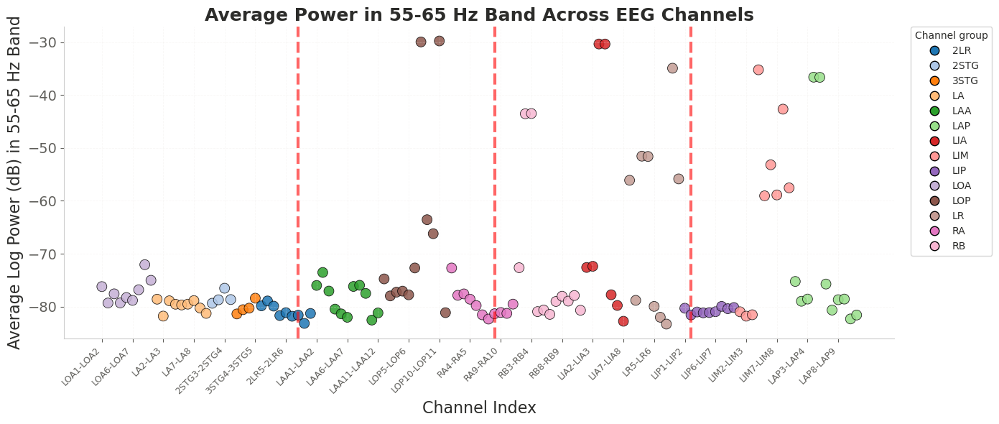

In [29]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.fft import fft, fftfreq
import re

# ----------------------------
# Compute mean and FFT parameters
# ----------------------------
mean_data = np.mean(eeg_no_encoding, axis=0)  # (n_channels, n_samples)
sampling_rate = 1000  # Hz
n_samples = mean_data.shape[1]
freqs = fftfreq(n_samples, 1/sampling_rate)[:n_samples//2]
freq_min, freq_max = 55, 65
freq_mask = (freqs >= freq_min) & (freqs <= freq_max)
n_channels = mean_data.shape[0]

# ----------------------------
# Extract average power in 55-65 Hz band for each channel
# ----------------------------
band_powers = []
for ch in range(n_channels):
    fft_data = fft(mean_data[ch, :])
    power_spectrum = np.abs(fft_data[:n_samples//2])**2
    log_power = 10 * np.log10(power_spectrum + 1e-12)
    band_powers.append(np.mean(log_power[freq_mask]))
band_powers = np.array(band_powers)

# ----------------------------
# Group channels by prefix (LOA, LAP, etc.) and assign colors
# ----------------------------
channel_names = [str(x) for x in channels]
from matplotlib.colors import ListedColormap
def channel_group(name: str) -> str:
    first = name.split("-")[0]          # "2LR1" from "2LR1_2LR2"
    grp = re.sub(r"\d+$", "", first)    # remove trailing digits only -> "2LR"
    return grp if grp else first

groups = np.array([channel_group(n) for n in channel_names])
unique_groups = sorted(np.unique(groups))

# pick a categorical colormap with many distinct colors
cmap = plt.get_cmap("tab20")  # try "tab10" if you have <=10 groups

group_to_color = {g: cmap(i % cmap.N) for i, g in enumerate(unique_groups)}
point_colors = [group_to_color[g] for g in groups]

# ----------------------------
# Plot
# ----------------------------
fig, ax = plt.subplots(figsize=(14, 6))
x = np.arange(n_channels)

ax.scatter(
    x, band_powers,
    s=100, alpha=0.85,
    c=point_colors,
    edgecolors="black", linewidth=0.6
)

# Add vertical lines every 32 channels
for vx in range(32, n_channels, 32):
    ax.axvline(x=vx, color="red", linestyle="--", linewidth=3.0, alpha=0.6)

ax.set_xlabel("Channel Index", fontsize=16)
ax.set_ylabel("Average Log Power (dB) in 55-65 Hz Band", fontsize=16)
ax.set_title("Average Power in 55-65 Hz Band Across EEG Channels", fontsize=18, fontweight="bold")
ax.grid(True, alpha=0.3)
ax.tick_params(axis="x", labelsize=14)
ax.tick_params(axis="y", labelsize=14)

# Optional: show some x tick labels
ax.set_xticks(x[::5])
ax.set_xticklabels([channel_names[i] for i in x[::5]], rotation=45, ha="right", fontsize=9)

# Legend (one entry per group)
handles = [
    plt.Line2D([0], [0], marker="o", color="w",
               markerfacecolor=group_to_color[g],
               markeredgecolor="black",
               markersize=9, label=g)
    for g in unique_groups
]
ax.legend(handles=handles, title="Channel group", bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0)
plt.tight_layout()
plt.savefig("band_power_plot.png", dpi=150, bbox_inches="tight")
plt.show()

In [30]:
z_scores = (band_powers - np.mean(band_powers)) / np.std(band_powers)
sorted_indices = np.argsort(band_powers)[::-1]

for idx in sorted_indices:
    ch_name = channel_names[idx]
    power = band_powers[idx]
    z_score = z_scores[idx]

    if z_score > 2:
        marker = " ← Z > 2 (HIGH)"
    elif z_score < -2:
        marker = " ← Z < -2 (LOW)"
    else:
        marker = ""

    print(f"  {ch_name:15s} | Power: {power:8.4f} dB | Z-score: {z_score:+6.2f}{marker}")

  LOP10-LOP11     | Power: -29.7528 dB | Z-score:  +3.23 ← Z > 2 (HIGH)
  LOP7-LOP8       | Power: -29.9318 dB | Z-score:  +3.22 ← Z > 2 (HIGH)
  LIA3-LIA4       | Power: -30.3215 dB | Z-score:  +3.19 ← Z > 2 (HIGH)
  LIA4-LIA5       | Power: -30.3245 dB | Z-score:  +3.19 ← Z > 2 (HIGH)
  LR8-LR9         | Power: -34.9040 dB | Z-score:  +2.85 ← Z > 2 (HIGH)
  LIM4-LIM5       | Power: -35.2045 dB | Z-score:  +2.83 ← Z > 2 (HIGH)
  LAP4-LAP5       | Power: -36.5990 dB | Z-score:  +2.73 ← Z > 2 (HIGH)
  LAP5-LAP6       | Power: -36.6284 dB | Z-score:  +2.72 ← Z > 2 (HIGH)
  LIM8-LIM9       | Power: -42.6504 dB | Z-score:  +2.28 ← Z > 2 (HIGH)
  RB3-RB4         | Power: -43.4764 dB | Z-score:  +2.22 ← Z > 2 (HIGH)
  RB2-RB3         | Power: -43.5209 dB | Z-score:  +2.22 ← Z > 2 (HIGH)
  LR3-LR4         | Power: -51.5415 dB | Z-score:  +1.62
  LR4-LR5         | Power: -51.6028 dB | Z-score:  +1.62
  LIM6-LIM7       | Power: -53.1766 dB | Z-score:  +1.50
  LR9-LR10        | Power: -55.8464 d

In [31]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.fft import fft, fftfreq

mean_data = np.mean(eeg_no_encoding, axis=0)

# FFT parameters
sampling_rate = 1000  # Hz
n_samples = mean_data.shape[1]
freqs = fftfreq(n_samples, 1/sampling_rate)[:n_samples//2]
n_channels = mean_data.shape[0]

# ── Compute band power for z-score (55–65 Hz) ─────────────────────────────
band_mask = (freqs >= 55) & (freqs <= 65)
band_powers = []
for channel in range(n_channels):
    fft_data = fft(mean_data[channel, :])
    power_spectrum = np.abs(fft_data[:n_samples//2])**2
    log_power = 10 * np.log10(power_spectrum + 1e-20)
    band_powers.append(log_power[band_mask].mean())
band_powers = np.array(band_powers)
std = np.std(band_powers, ddof=1)
z_scores = (band_powers - np.mean(band_powers)) / (std if std > 0 else 1)

# ── Plot ───────────────────────────────────────────────────────────────────
n_cols = 4
n_rows = int(np.ceil(n_channels / n_cols))
fig, axes = plt.subplots(n_rows, n_cols,
                         figsize=(n_cols * 10, n_rows * 6),
                         constrained_layout=True,
                         sharey=True)   # <-- shared y-axis
axes = axes.flatten()

print("Line-noise power by channel")
for channel in range(n_channels):
    fft_data = fft(mean_data[channel, :])
    power_spectrum = np.abs(fft_data[:n_samples//2])**2
    log_power = 10 * np.log10(power_spectrum + 1e-20)

    is_outlier = z_scores[channel] > 2
    color = 'red' if is_outlier else 'steelblue'
    lw    = 1.8   if is_outlier else 1.2

    axes[channel].plot(freqs, log_power, linewidth=lw, color=color)
    axes[channel].set_ylabel('Power (dB)', fontsize=24)
    ch_name = channels.iloc[channel]
    title   = f'{ch_name}  [Z={z_scores[channel]:+.2f}]'
    axes[channel].set_title(title, fontsize=26,
                            color='red' if is_outlier else 'black',
                            fontweight='bold')
    axes[channel].set_xlabel('Frequency (Hz)', fontsize=24)
    axes[channel].tick_params(labelsize=20)
    axes[channel].grid(True, alpha=0.3)
    axes[channel].set_xlim(0, 100)
    axes[channel].spines[['top', 'right']].set_visible(False)

    if is_outlier:
        axes[channel].axvspan(55, 65, color='red', alpha=0.08,
                              label='band used for Z')

for i in range(n_channels, len(axes)):
    axes[i].set_visible(False)

fig.savefig(f'{write_fig_path}/line_noise.pdf', format='pdf', dpi=300,
            bbox_inches='tight')
plt.show()

Line-noise power by channel


---
## Summary Checklist

After running all modules, use this checklist to determine whether the session passes QC:

### ✅ Protocol Checks
- [ ] All expected event counts passed validation (`n/n checks passed` displayed in green)
- [ ] Stimulation was successfully delivered during all intended task phases (e.g., encoding and retrieval)
- [ ] Commanded stimulation frequencies (e.g., 3 Hz and/or 8 Hz) were correctly detected for each trial/session

### ✅ Behavioral Checks
- [ ] Navigation times fall within a plausible range (no extreme outliers suggesting task interruption)
- [ ] Navigation trajectories indicate active exploration of the virtual environment throughout the session
- [ ] Recall accuracy is greater than zero, indicating participant engagement with the task

### ✅ Stimulation Verification Checks
- [ ] Clear stimulation artifact observed at the stimulated contact pair (confirms successful stimulation delivery)
- [ ] Artifact onset occurs within ±20 ms of the expected stimulation marker (verifies synchronization and timing accuracy)
- [ ] Artifact magnitude decays with increasing distance from the stimulated contacts (confirms spatial specificity)
- [ ] Stimulation artifact morphology is stable and consistent across trials

### ✅ Channel Integrity and Artifact Checks
- [ ] Channels flagged by both trial-to-trial variability and temporal variability are documented for manual review
- [ ] High-z channels do not involve a large proportion of the recording array (>20% may indicate a systemic recording or referencing problem)
- [ ] Line-noise contamination is limited to a small subset of channels (widespread 60 Hz contamination may indicate grounding failure)


**If any major QC concerns are identified, notify the Herz Lab clinical/research team immediately**. 
Early detection may allow troubleshooting, hardware adjustment, or scheduling of additional recording sessions while the patient remains hospitalized.